<a href="https://colab.research.google.com/github/NguyenBao-dev/Face-Identification-with-Probabilistic-Graphical-Model/blob/main/251805006_NguyenLeGiaBao.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Problem: Face Identification with Probabilistic Graphical Models

# Raw Data

Since Google Classroom was restricting data, please access this Google Drive link to download raw data that was used to train and evaluate the models below

Link: https://drive.google.com/file/d/1GYgVycQ16j1XgstcOU8UlPLamLkNehfo/view?usp=sharing

# Setup

In [1]:
!pip install kagglehub tensorflow facenet-pytorch pillow numpy pandas scikit-learn pgmpy pomegranate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 25.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 30.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 36.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 24.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.4/98.4 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.5/755.5 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 113.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 101.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 51.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 618.4 kB/s eta 0:00:00
   ━━━━━━

In [1]:
import os
import numpy as np
import pandas as pd
from glob import glob
from tqdm import tqdm
from PIL import Image

import torch
from facenet_pytorch import InceptionResnetV1
from torchvision import transforms

from sklearn.metrics import confusion_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
from sklearn.preprocessing import KBinsDiscretizer

from pgmpy.models import DiscreteBayesianNetwork, LinearGaussianBayesianNetwork
from pgmpy.estimators import HillClimbSearch, MaximumLikelihoodEstimator
from pgmpy.inference import VariableElimination
from pgmpy.factors.continuous import LinearGaussianCPD

from pomegranate.distributions import Normal, IndependentComponents
from pomegranate.hmm import DenseHMM, SparseHMM
from pomegranate.gmm import GeneralMixtureModel

import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import networkx as nx

import seaborn as sns
import pandas as pd

import kagglehub

# Get raw pixels

In [2]:
def load_raw_images(data_path, n_persons=10, imgs_per_person=20, img_size=(160, 160), grayscale=True):
    person_dirs = sorted([
        d for d in os.listdir(data_path) if os.path.isdir(os.path.join(data_path, d))
    ])[:n_persons]

    vectors, labels = [], []
    for person in tqdm(person_dirs, desc="Extracting raw pixel vectors"):
        image_paths = glob(os.path.join(data_path, person, "*.jpg"))[:imgs_per_person]
        for ip in image_paths:
            try:
                img = Image.open(ip).convert("L" if grayscale else "RGB").resize(img_size)
                arr = np.array(img) / 255.0
                vec = arr.flatten()
                vectors.append(vec)
                labels.append(person)
            except Exception as e:
                print("Skipping", ip, e)
    return np.array(vectors), np.array(labels)

# Extract features

Extract features from image with FaceNet


In [3]:
IMG_SIZE = (160, 160)
transform = transforms.Compose([
    transforms.Resize(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

device = "cuda" if torch.cuda.is_available() else "cpu"
embedder = InceptionResnetV1(pretrained="vggface2").eval().to(device)

def get_embedding(img_path):
    img = Image.open(img_path).convert("RGB")
    x = transform(img).unsqueeze(0).to(device)
    with torch.no_grad():
        emb = embedder(x).cpu().numpy().flatten()
    return emb

  0%|          | 0.00/107M [00:00<?, ?B/s]

In [4]:
def load_embeddings(data_path, n_persons=10, imgs_per_person=20):
    person_dirs = sorted([d for d in os.listdir(data_path) if os.path.isdir(os.path.join(data_path, d))])[:n_persons]
    embeddings, labels = [], []
    for person in tqdm(person_dirs, desc="Extracting embeddings"):
        image_paths = glob(os.path.join(data_path, person, "*.jpg"))[:imgs_per_person]
        for ip in image_paths:
            try:
                emb = get_embedding(ip)
                embeddings.append(emb)
                labels.append(person)
            except Exception as e:
                print("Skipping", ip, e)
    return np.array(embeddings), np.array(labels)

# Discretization

In [5]:
def discretize_kbins(train_array, test_array, bins=5):
    enc = KBinsDiscretizer(n_bins=bins, encode="ordinal", strategy="quantile")
    train_disc = enc.fit_transform(train_array).astype(int)
    test_disc = enc.transform(test_array).astype(int)
    return train_disc, test_disc, enc

# Export CSV

In [6]:
def export_fold_data_to_csv_combined(fold_data, filename, model_name):
    all_data = []

    for i, data in enumerate(fold_data, 1):
        df_train = pd.DataFrame(data["X_train"])
        df_train["Identity"] = data["y_train"]
        df_train["Fold"] = i
        df_train["Split"] = "Train"

        df_test = pd.DataFrame(data["X_test"])
        df_test["Identity"] = data["y_test"]
        if "y_pred" in data:
            df_test["Prediction"] = data["y_pred"]
        df_test["Fold"] = i
        df_test["Split"] = "Test"

        all_data.append(df_train)
        all_data.append(df_test)

    combined_df = pd.concat(all_data, ignore_index=True)
    combined_df.to_csv(filename, index=False)

# Export Excel

In [7]:
def export_fold_data_to_excel(fold_data, filename, model_name):
    with pd.ExcelWriter(filename, engine="openpyxl", mode="w") as writer:
        for i, data in enumerate(fold_data, 1):
            df_train = pd.DataFrame(data["X_train"])
            df_train["Identity"] = data["y_train"]

            df_test = pd.DataFrame(data["X_test"])
            df_test["Identity"] = data["y_test"]

            df_test["Prediction"] = data["y_pred"]

            df_train.to_excel(writer, sheet_name=f"{model_name}_Fold{i}_Train", index=False)
            df_test.to_excel(writer, sheet_name=f"{model_name}_Fold{i}_Test", index=False)

# pgmpy - Discrete Bayesian Network

## Structure Learning

In [8]:
def learn_structure_bn(df_train, features, target="Identity"):
    hc = HillClimbSearch(df_train)
    best_model = hc.estimate()
    bn = DiscreteBayesianNetwork(best_model.edges())
    bn.add_nodes_from(features + [target])

    return bn

## Parameter Learning

In [9]:
def learn_parameters_bn(bn, df_train, features, y_train, bins=5):
    state_names = {"Identity": list(np.unique(y_train))}
    for f in features:
        state_names[f] = list(range(bins))
    bn.fit(df_train, estimator=MaximumLikelihoodEstimator, state_names=state_names)
    return bn, state_names

## Inference

In [10]:
def make_infer(bn):
    return VariableElimination(bn)

def predict_bn(infer, features, identity_states, X_test):
    preds = []
    for _, row in X_test.iterrows():
        obs = {f: int(row[f]) for f in features}
        q = infer.query(variables=["Identity"], evidence=obs, show_progress=False)
        vals, order = q.values.flatten(), q.state_names["Identity"]
        probs = np.array([vals[order.index(s)] if s in order else 0 for s in identity_states])
        preds.append(identity_states[np.argmax(probs)])
    return preds

## Cross validation

In [11]:
def cross_validate_discrete_bn(embeddings, labels, pca_dim=10, folds=5, bins=5, show_struct_params=False, export_file=None):
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=42)
    metrics, models, fold_data = [], [], []

    for fold, (train_idx, test_idx) in enumerate(skf.split(embeddings, labels), 1):
        print(f"\n=== Discrete BN: Fold {fold} ===")
        X_train, X_test = embeddings[train_idx], embeddings[test_idx]
        y_train, y_test = labels[train_idx], labels[test_idx]

        pca = PCA(n_components=pca_dim, random_state=42)
        X_train_pca, X_test_pca = pca.fit_transform(X_train), pca.transform(X_test)
        features = [f"F{i}" for i in range(pca_dim)]

        X_train_disc, X_test_disc, enc = discretize_kbins(X_train_pca, X_test_pca, bins=bins)
        df_train = pd.DataFrame(X_train_disc, columns=features)
        df_test = pd.DataFrame(X_test_disc, columns=features)
        df_train["Identity"], df_test["Identity"] = y_train, y_test

        bn = learn_structure_bn(df_train, features, target="Identity")
        bn, state_names = learn_parameters_bn(bn, df_train, features, y_train, bins=bins)
        infer = make_infer(bn)

        if show_struct_params:
            print("Learned structure:", bn.edges())
            plot_bn_structure(bn, title=f"Discrete BN Structure - Fold {fold}")

        y_pred = predict_bn(infer, features, state_names["Identity"], df_test)

        acc = accuracy_score(y_test, y_pred)
        prec, rec, f1, _ = precision_recall_fscore_support(
            y_test, y_pred, average="macro", zero_division=0
        )
        print(f"Acc: {acc} \nPrec: {prec} \nRec: {rec} \nF1: {f1}")
        metrics.append((acc, prec, rec, f1))

        models.append({
            "bn": bn,
            "infer": infer,
            "pca": pca,
            "features": features,
            "state_names": state_names,
            "disc_enc": enc
        })

        fold_data.append({
            "X_train": X_train,
            "X_test": X_test,
            "y_train": y_train,
            "y_test": y_test,
            "y_pred": y_pred
        })

    if export_file:
        export_fold_data_to_csv_combined(fold_data, export_file, "BN")

    return np.array(metrics), models

# pgmpy - Linear Gaussian Bayesian Network

## Structure Learning

In [12]:
def learn_structure_lgbn(df_train, features, target="Identity_num"):
    hc = HillClimbSearch(df_train)
    best_model = hc.estimate()
    lgbn = LinearGaussianBayesianNetwork(best_model.edges())
    lgbn.add_nodes_from(features + [target])
    return lgbn

## Parameter Learning

In [13]:
def learn_parameters_lgbn(lgbn, df_train, features, y_train):
    from sklearn.linear_model import LinearRegression

    identities = np.unique(y_train)
    id_map = {id_: i for i, id_ in enumerate(identities)}
    df_train = df_train.copy()
    df_train["Identity_num"] = df_train["Identity"].map(id_map)

    for f in features:
        X = df_train[["Identity_num"]].values
        y = df_train[f].values
        reg = LinearRegression().fit(X, y)
        slope = reg.coef_[0]
        intercept = reg.intercept_
        std = np.std(y - reg.predict(X))

        cpd = LinearGaussianCPD(
            variable=f,
            evidence=["Identity_num"],
            beta=[slope],
            std=std
        )
        lgbn.add_cpds(cpd)

    return lgbn, identities

## Inference

In [14]:
def predict_lgbn(lgbn, features, identities, id_map, row):
    likelihoods = []

    for identity in identities:
        identity_num = id_map[identity]
        log_prob = 0.0

        for cpd in lgbn.cpds:
            if isinstance(cpd, LinearGaussianCPD) and cpd.variable in features:
                f = cpd.variable
                x_val = row[f]

                beta = cpd.beta[0] if len(cpd.beta) > 0 else 0.0
                std = cpd.std

                mean = beta * identity_num
                log_prob += -0.5 * np.log(2 * np.pi * std**2) - ((x_val - mean) ** 2) / (2 * std**2)

        likelihoods.append(log_prob)

    return identities[np.argmax(likelihoods)]

## Cross validation

In [15]:
def cross_validate_lgbn(embeddings, labels, pca_dim=10, folds=5, show_struct_params=False, export_file=None):
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=42)
    metrics, models, fold_data = [], [], []

    for fold, (train_idx, test_idx) in enumerate(skf.split(embeddings, labels), 1):
        print(f"\n=== LGBN: Fold {fold} ===")
        X_train, X_test = embeddings[train_idx], embeddings[test_idx]
        y_train, y_test = labels[train_idx], labels[test_idx]

        # PCA per fold
        pca = PCA(n_components=pca_dim, random_state=42)
        X_train_pca, X_test_pca = pca.fit_transform(X_train), pca.transform(X_test)
        features = [f"F{i}" for i in range(pca_dim)]

        df_train_cont = pd.DataFrame(X_train_pca, columns=features)
        df_train_cont["Identity"] = y_train
        df_test_cont = pd.DataFrame(X_test_pca, columns=features)
        df_test_cont["Identity"] = y_test

        # Structure + Parameters
        lgbn = learn_structure_lgbn(df_train_cont, features, target="Identity_num")
        lgbn, identities = learn_parameters_lgbn(lgbn, df_train_cont, features, y_train)
        id_map = {id_: i for i, id_ in enumerate(identities)}

        if show_struct_params:
            print("Learned structure:", lgbn.edges())
            plot_bn_structure(lgbn, title=f"LGBN Structure - Fold {fold}")

        # Predictions
        preds = [predict_lgbn(lgbn, features, identities, id_map, row) for _, row in df_test_cont.iterrows()]

        # Metrics
        acc = accuracy_score(y_test, preds)
        prec, rec, f1, _ = precision_recall_fscore_support(y_test, preds, average="macro", zero_division=0)
        print(f"Acc: {acc} \nPrec: {prec} \nRec: {rec} \nF1: {f1}")
        metrics.append((acc, prec, rec, f1))

        # Save model info
        models.append({
            "lgbn": lgbn,
            "pca": pca,
            "features": features,
            "identities": identities,
            "id_map": id_map
        })

        fold_data.append({
            "X_train": X_train,
            "X_test": X_test,
            "y_train": y_train,
            "y_test": y_test,
            "y_pred": preds
        })

    if export_file:
        export_fold_data_to_csv_combined(fold_data, export_file, "LGBN")

    return np.array(metrics), models

# pomegranate - Hidden Makov Model

## Training

In [16]:
def train_hmm_models(X_train, y_train, n_states=3):
    models = {}
    identities = np.unique(y_train)

    for identity in identities:
        X_id = X_train[y_train == identity]

        sequences = [x.reshape(1, -1, 1) for x in X_id]

        dists = [Normal() for _ in range(n_states)]
        model = DenseHMM(dists)
        model.fit(sequences)

        models[identity] = model

    return models

## Inference

In [17]:
def predict_hmm(models, x):
    seq = x.reshape(1, -1, 1)
    scores = {identity: model.log_probability(seq) for identity, model in models.items()}
    return max(scores, key=scores.get), scores

## Cross validation

In [18]:
def cross_validate_hmm(embeddings, labels, pca_dim=10, folds=5, n_components=3, show_struct_params=False, export_file=None):
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=42)
    metrics, models_list, fold_data = [], [], []

    for fold, (train_idx, test_idx) in enumerate(skf.split(embeddings, labels), 1):
        print(f"\n=== HMM: Fold {fold} ===")
        X_train, X_test = embeddings[train_idx], embeddings[test_idx]
        y_train, y_test = labels[train_idx], labels[test_idx]

        # PCA
        pca = PCA(n_components=pca_dim, random_state=42)
        X_train_pca, X_test_pca = pca.fit_transform(X_train), pca.transform(X_test)

        # Train HMMs
        models = train_hmm_models(X_train_pca, y_train, n_states=n_components)

        # Predictions
        preds = []
        for x in X_test_pca:
            pred, _ = predict_hmm(models, x)
            preds.append(pred)

        # Metrics
        acc = accuracy_score(y_test, preds)
        prec, rec, f1, _ = precision_recall_fscore_support(y_test, preds, average="macro", zero_division=0)
        print(f"Acc: {acc} \nPrec: {prec} \nRec: {rec} \nF1: {f1}")
        metrics.append((acc, prec, rec, f1))

        # Save for later
        models_list.append({
            "models": models,
            "pca": pca
        })

        fold_data.append({
            "X_train": X_train,
            "X_test": X_test,
            "y_train": y_train,
            "y_test": y_test,
            "y_pred": preds
        })

        if show_struct_params:
            plot_hmm_models(models, fold)

    if export_file:
        export_fold_data_to_csv_combined(fold_data, export_file, "HMM")

    return np.array(metrics), models_list

# pomegranate - General Mixture Model

## Training

In [19]:
def train_gmm_models(X_train, y_train, n_components=2):
    models = {}
    identities = np.unique(y_train)

    for identity in identities:
        X_id = X_train[y_train == identity].astype(np.float32)
        n_features = X_id.shape[1]

        dists = []
        for _ in range(n_components):
            comps = []
            for f in range(n_features):
                mean = np.mean(X_id[:, f]).astype(np.float32)
                std = np.std(X_id[:, f]).astype(np.float32)
                if std == 0:
                    std = np.float32(1e-3)
                comps.append(Normal(
                    means=np.array([mean], dtype=np.float32),
                    covs=np.array([[std ** 2]], dtype=np.float32)
                ))
            dists.append(IndependentComponents(comps))

        gmm = GeneralMixtureModel(dists)
        gmm.fit(X_id)

        models[identity] = gmm

    return models

## Inference

In [20]:
def predict_gmm(models, x):
    scores = {identity: model.log_probability(x.reshape(1, -1))
              for identity, model in models.items()}
    return max(scores, key=scores.get), scores

## Cross validation

In [21]:
def cross_validate_gmm(embeddings, labels, pca_dim=10, folds=5, n_components=2, show_struct_params=False, export_file=None):
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=42)
    metrics, models_list, fold_data = [], [], []

    for fold, (train_idx, test_idx) in enumerate(skf.split(embeddings, labels), 1):
        print(f"\n=== GMM: Fold {fold} ===")
        X_train, X_test = embeddings[train_idx], embeddings[test_idx]
        y_train, y_test = labels[train_idx], labels[test_idx]

        pca = PCA(n_components=pca_dim, random_state=42)
        X_train_pca, X_test_pca = pca.fit_transform(X_train), pca.transform(X_test)

        models = train_gmm_models(X_train_pca, y_train, n_components=n_components)

        preds = []
        for x in X_test_pca:
            pred, _ = predict_gmm(models, x)
            preds.append(pred)

        acc = accuracy_score(y_test, preds)
        prec, rec, f1, _ = precision_recall_fscore_support(y_test, preds, average="macro", zero_division=0)
        print(f"Acc: {acc} \nPrec: {prec} \nRec: {rec} \nF1: {f1}")
        metrics.append((acc, prec, rec, f1))

        models_list.append({
            "models": models,
            "pca": pca
        })

        fold_data.append({
            "X_train": X_train,
            "X_test": X_test,
            "y_train": y_train,
            "y_test": y_test,
            "y_pred": preds
        })

        if show_struct_params:
            plot_gmm_models(models, fold)

    if export_file:
        export_fold_data_to_csv_combined(fold_data, export_file, "GMM")

    return np.array(metrics), models_list

# Visualization

In [22]:
def plot_bn_structure(bn, title="Learned Bayesian Network"):
    G = nx.DiGraph()
    G.add_nodes_from(bn.nodes())
    G.add_edges_from(bn.edges())

    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G, seed=42, k=1.5)

    nx.draw(
        G, pos,
        with_labels=True,
        node_size=2000,
        node_color="lightblue",
        font_size=10,
        font_weight="bold",
        edge_color="gray",
        arrows=True
    )

    isolated = list(nx.isolates(G))
    if isolated:
        nx.draw_networkx_nodes(
            G, pos,
            nodelist=isolated,
            node_color="lightcoral",
            node_size=2000
        )

    plt.title(title)
    plt.show()

In [23]:
def plot_bn_cpts(bn, max_vars=3):
    cpds = bn.get_cpds()
    n = min(len(cpds), max_vars)

    rows, cols = 5, 2
    fig, axes = plt.subplots(rows, cols, figsize=(20, 20))
    axes = axes.flatten()

    for ax, cpd in zip(axes, cpds[:n]):
        try:
            var = cpd.variable
            var_card = cpd.get_cardinality([var])[var]
            states = list(range(var_card))

            evidence = cpd.get_evidence()
            if evidence:
                evid_cards = [cpd.get_cardinality([e])[e] for e in evidence]
                combos = np.array(np.meshgrid(*[range(c) for c in evid_cards])).T.reshape(-1, len(evidence))
                col_labels = [",".join(map(str, combo)) for combo in combos]
            else:
                col_labels = ["P"]

            mat = np.array(cpd.get_values())
            if mat.ndim == 1:
                mat = mat.reshape(-1, 1)

            df_cpd = pd.DataFrame(mat, index=states, columns=col_labels)

            sns.heatmap(df_cpd, annot=True, fmt=".2f", cmap="Blues", cbar=True, ax=ax)
            ax.set_title(f"CPT: {var}")
        except Exception as e:
            print(f"Error plotting CPT for {cpd.variable}: {e}")
            ax.axis("off")

    plt.tight_layout()
    plt.show()

In [24]:
def plot_lgbn_cpds(lgbn, max_vars=5):
    cpds = lgbn.cpds
    n = min(len(cpds), max_vars)

    fig, axes = plt.subplots(1, n, figsize=(5 * n, 4))
    if n == 1:
        axes = [axes]

    for ax, cpd in zip(axes, cpds[:n]):
        try:
            if hasattr(cpd, "beta"):
                betas = cpd.beta
                std = cpd.std
                parents = cpd.evidence if cpd.evidence else []

                coeffs = pd.Series(betas, index=["Intercept"] + parents)
                df_params = coeffs.to_frame("Coefficient")

                sns.barplot(x=df_params.index, y="Coefficient", data=df_params, ax=ax)
                ax.set_title(f"{cpd.variable}\nσ={std:.2f}")
                ax.axhline(0, color="black", linestyle="--", linewidth=1)
                ax.tick_params(axis="x", rotation=45)
            else:
                ax.text(0.5, 0.5, "Not LinearGaussianCPD", ha="center", va="center")
                ax.axis("off")

        except Exception as e:
            print(f"Error plotting params for {getattr(cpd, 'variable', '?')}: {e}")
            ax.axis("off")

    plt.tight_layout()
    plt.show()

In [25]:
def plot_hmm_models(models, fold=None):
    for identity, hmm in models.items():
        n_states = hmm.d

        fig, axes = plt.subplots(1, 2, figsize=(12, 5))

        trans = hmm.edges.detach().cpu().numpy()
        trans_norm = trans / trans.sum(axis=1, keepdims=True)
        trans_norm = np.nan_to_num(trans_norm)

        sns.heatmap(
            trans_norm, annot=True, fmt=".2f", cmap="Blues", ax=axes[0], cbar=False
        )
        if fold:
          axes[0].set_title(f"HMM Transitions\nIdentity {identity}, Fold {fold}")
        else:
          axes[0].set_title(f"HMM Transitions\nIdentity {identity}")
        axes[0].set_xlabel("To state")
        axes[0].set_ylabel("From state")

        means = []
        for state in range(n_states):
            dist = hmm.distributions[state]
            if hasattr(dist, "means"):
                mu = dist.means.detach().cpu().numpy().ravel()
            elif hasattr(dist, "mean"):
                mu = np.array([dist.mean])
            else:
                mu = np.zeros(1)
            means.append(mu)

        means = np.array(means)

        if means.ndim == 1:
            axes[1].bar(range(n_states), means)
            axes[1].set_xticks(range(n_states))
            axes[1].set_title("Emission Means (Univariate)")
            axes[1].set_xlabel("State")
            axes[1].set_ylabel("Mean")
        else:
            sns.heatmap(means, annot=True, fmt=".2f", cmap="coolwarm", ax=axes[1])
            axes[1].set_title("Emission Means (Multivariate)")
            axes[1].set_xlabel("Feature dim")
            axes[1].set_ylabel("State")

        plt.suptitle(f"HMM Identity {identity} - Fold {fold}")
        plt.tight_layout()
        plt.show()

In [26]:
def plot_hmm_structure(hmm, n_states, title="HMM Structure"):
    G = nx.DiGraph()

    hidden_nodes = [f"z{t}" for t in range(1, n_states+1)]
    observed_nodes = [f"x{t}" for t in range(1, n_states+1)]

    for i in range(n_states-1):
        G.add_edge(hidden_nodes[i], hidden_nodes[i+1])

    for z, x in zip(hidden_nodes, observed_nodes):
        G.add_edge(z, x)

    pos = {}
    for i, z in enumerate(hidden_nodes):
        pos[z] = (i, 1)
    for i, x in enumerate(observed_nodes):
        pos[x] = (i, 0)

    plt.figure(figsize=(10, 3))
    nx.draw(G, pos, with_labels=True,
            node_color="lightblue", node_size=2000, arrowsize=20)
    plt.title(title)
    plt.show()

In [27]:
def plot_gmm_models(models, fold=None, pca_dim=2):
    for identity, gmm in models.items():
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))

        weights = gmm.priors.detach().cpu().numpy()
        axes[0].bar(range(len(weights)), weights)
        axes[0].set_title(f"GMM Weights\nIdentity {identity}, Fold {fold}")
        axes[0].set_xlabel("Component")
        axes[0].set_ylabel("Weight")

        means = []
        for dist in gmm.distributions:
            if hasattr(dist, "means"):
                mu = dist.means.detach().cpu().numpy().ravel()
            elif hasattr(dist, "mean"):
                mu = np.array([dist.mean])
            else:
                mu = np.zeros(pca_dim)
            means.append(mu)

        means = np.array(means)

        if means.ndim == 1:
            axes[1].bar(range(len(means)), means)
            axes[1].set_xticks(range(len(means)))
            axes[1].set_title("Component Means (Univariate)")
            axes[1].set_xlabel("Component")
            axes[1].set_ylabel("Mean")
        else:
            sns.heatmap(means, annot=True, fmt=".2f", cmap="coolwarm", ax=axes[1])
            axes[1].set_title("Component Means (Multivariate)")
            axes[1].set_xlabel("Feature dim")
            axes[1].set_ylabel("Component")

        if fold:
          plt.suptitle(f"GMM Identity {identity} - Fold {fold}")
        else:
          plt.suptitle(f"GMM Identity {identity}")
        plt.tight_layout()
        plt.show()

In [28]:
def plot_gmm_structure(gmm, title="GMM Structure"):
    for identity, gmm in gmm.items():
        G = nx.DiGraph()
        G.add_node("z")
        G.add_node("x")
        G.add_edge("z", "x")

        try:
            cluster_nodes = [f"Cluster {i}" for i in range(len(gmm.distributions))]
        except AttributeError:
            cluster_nodes = []

        for c in cluster_nodes:
            G.add_edge("z", c)
            G.add_edge(c, "x")

        pos = {"z": (0, 1), "x": (0, 0)}
        for i, c in enumerate(cluster_nodes):
            pos[c] = (i - len(cluster_nodes) / 2, 0.5)

        plt.figure(figsize=(8, 4))
        nx.draw(G, pos, with_labels=True,
                node_color="lightgreen", node_size=2000, arrowsize=20)
        plt.title(title)
        plt.show()

In [29]:
def plot_model_comparison(model_results, title="Model Comparison (Cross-Validation Metrics)"):
    labels = ["Acc", "Prec", "Rec", "F1"]
    models = [res["Model"] for res in model_results]

    # Extract means for each metric
    metric_means = {label: [res["Metrics"][label]["Mean"] for res in model_results] for label in labels}
    metric_stds = {label: [res["Metrics"][label]["Std"] for res in model_results] for label in labels}

    x = np.arange(len(models))
    width = 0.2

    plt.figure(figsize=(10, 6))
    for i, label in enumerate(labels):
        plt.bar(x + (i - 1.5) * width, metric_means[label],
                width, label=label, yerr=metric_stds[label], capsize=5)

    plt.title(title)
    plt.xticks(x, models)
    plt.ylabel("Score")
    plt.ylim(0, 1)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

In [30]:
def compare_results(*results_dfs, metrics_to_plot=None, save_path=None):
    # Combine results
    combined = pd.concat(results_dfs, ignore_index=True)
    combined.rename(columns=lambda c: c.replace("Train RAM (MB)", "Train RAM (MB)"), inplace=True)

    print("\n=== Combined Results Summary ===")
    summary = combined.groupby("Label").mean(numeric_only=True)
    print(summary.round(3))

    if metrics_to_plot is None:
        metrics_to_plot = ["Accuracy", "F1", "Train Time (s)", "Train RAM (MB)"]

    # --- Boxplots ---
    n_metrics = len(metrics_to_plot)
    fig, axes = plt.subplots(1, n_metrics, figsize=(5 * n_metrics, 5))

    if n_metrics == 1:
        axes = [axes]

    sns.set(style="whitegrid", font_scale=1.0)
    palette = sns.color_palette("Set2", len(combined["Label"].unique()))

    for ax, metric in zip(axes, metrics_to_plot):
        sns.boxplot(data=combined, x="Label", y=metric, ax=ax, palette=palette)
        ax.set_title(metric, fontsize=13)
        ax.set_xlabel("")
        ax.set_ylabel(metric)
        ax.tick_params(axis='x', rotation=20)

    plt.tight_layout()
    if save_path:
        plt.savefig(f"{save_path}_boxplots.png", bbox_inches="tight", dpi=150)
    plt.show()

    # --- Mean Comparison Bar Chart ---
    plt.figure(figsize=(8, 5))
    summary_plot = summary.reset_index()
    melted = summary_plot.melt(id_vars="Label", value_vars=["Accuracy", "F1"])
    sns.barplot(data=melted, x="Label", y="value", hue="variable", palette="Set2")
    plt.title("Mean Accuracy & F1 Comparison")
    plt.ylabel("Score")
    plt.xlabel("")
    plt.ylim(0, 1)
    plt.legend(title="")
    plt.xticks(rotation=15)
    plt.tight_layout()

    if save_path:
        plt.savefig(f"{save_path}_mean_scores.png", bbox_inches="tight", dpi=150)
    plt.show()

    return combined, summary

# Result

In [31]:
def summarize(metrics, name="BN"):
    labels = ["Acc", "Prec", "Rec", "F1"]
    mean, std = metrics.mean(axis=0), metrics.std(axis=0)
    print(f"\n{name} 5-fold CV results:")
    for i, label in enumerate(labels):
        print(f"{label}: {mean[i]:.3f} ± {std[i]:.3f}")

    results = {
        "Model": name,
        "Metrics": {
            label: {
                "Mean": mean[i],
                "Std": std[i],
                "PerFold": metrics[:, i].tolist()
            }
            for i, label in enumerate(labels)
        }
    }
    return results

In [32]:
DATASET = "hearfool/vggface2"

# Download latest version
path = kagglehub.dataset_download(DATASET)

print(path)

100%|██████████| 2.32G/2.32G [00:30<00:00, 80.7MB/s]

Extracting files...


/root/.cache/kagglehub/datasets/hearfool/vggface2/versions/1


## Compare raw pixel vs Embedding and PCA

In [33]:
import psutil, time, gc

def get_memory_usage_mb():
    process = psutil.Process(os.getpid())
    return process.memory_info().rss / (1024 * 1024)

In [34]:
def make_spiral_structure(features, target="Identity", step=3):
    edges = []
    n = len(features)

    # Chain-like connections
    for i in range(n - 1):
        edges.append((features[i], features[i + 1]))

    # Add some backward/skip edges to make it more "spiral"
    for i in range(0, n - step, step):
        edges.append((features[i], features[i + step]))

    # Connect target to a few early features (like a hub)
    for i in range(min(3, n)):
        edges.append((features[i], target))

    return edges

In [35]:
def learn_structure_bn_predefined(df_train, features, target="Identity", structure_type="spiral"):
    if structure_type == "spiral":
        edges = make_spiral_structure(features, target)
    else:
        raise ValueError(f"Unknown structure type: {structure_type}")

    bn = DiscreteBayesianNetwork(edges)
    bn.add_nodes_from(features + [target])
    return bn

In [36]:
def cross_validate(
    X, y, pca_dim=None, folds=5, bins=5,
    use_predefined_structure=False,
    structure_type="spiral",
    label="BN Experiment"
):
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=42)
    results_summary = []

    for fold, (train_idx, test_idx) in enumerate(skf.split(X, y), 1):
        print(f"\n=== {label}: Fold {fold} ===")
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # PCA if specified
        if pca_dim is not None:
            print(f"Applying PCA → {pca_dim} dims")
            pca = PCA(n_components=pca_dim, random_state=42)
            X_train, X_test = pca.fit_transform(X_train), pca.transform(X_test)
        else:
            pca = None

        features = [f"F{i}" for i in range(X_train.shape[1])]

        # Discretize
        X_train_disc, X_test_disc, enc = discretize_kbins(X_train, X_test, bins=bins)
        df_train = pd.DataFrame(X_train_disc, columns=features)
        df_test = pd.DataFrame(X_test_disc, columns=features)
        df_train["Identity"], df_test["Identity"] = y_train, y_test

        # --- Structure learning or predefined structure ---
        start_time = time.time()
        mem_before = get_memory_usage_mb()

        if use_predefined_structure:
            print(f"Using predefined '{structure_type}' structure.")
            bn = learn_structure_bn_predefined(df_train, features, target="Identity", structure_type=structure_type)
        else:
            print("Learning structure using Hill-Climb Search...")
            bn = learn_structure_bn(df_train, features, target="Identity")

        # Parameter learning
        bn, state_names = learn_parameters_bn(bn, df_train, features, y_train, bins=bins)
        infer = make_infer(bn)

        train_time = time.time() - start_time
        mem_after = get_memory_usage_mb()

        # --- Inference ---
        start_inf = time.time()
        y_pred = predict_bn(infer, features, state_names["Identity"], df_test)
        test_time = time.time() - start_inf

        # --- Metrics ---
        acc = accuracy_score(y_test, y_pred)
        prec, rec, f1, _ = precision_recall_fscore_support(y_test, y_pred, average="macro", zero_division=0)
        print(f"[{label} | Fold {fold}] Acc={acc:.3f}, Prec={prec:.3f}, Rec={rec:.3f}, F1={f1:.3f}")
        print(f"TrainTime={train_time:.2f}s, TestTime={test_time:.2f}s, RAM={mem_after - mem_before:.1f}MB")

        results_summary.append({
            "Fold": fold,
            "Label": label,
            "Accuracy": acc,
            "Precision": prec,
            "Recall": rec,
            "F1": f1,
            "Train Time (s)": train_time,
            "Test Time (s)": test_time,
            "Train RAM (MB)": mem_after - mem_before
        })

    results_df = pd.DataFrame(results_summary)
    print(f"\n==== Summary ({label}) ====")
    print(results_df.mean(numeric_only=True))
    return results_df

In [37]:
train_path = path + "/train"

embeddings, labels = load_embeddings(train_path, n_persons=20, imgs_per_person=100)
metrics_emb = cross_validate(
    embeddings, labels,
    pca_dim=10,
    use_predefined_structure=False,
    label="Embeddings+PCA+Learned"
)

Extracting embeddings: 100%|██████████| 20/20 [03:12<00:00,  9.63s/it]



=== Embeddings+PCA+Learned: Fold 1 ===
Applying PCA → 10 dims
Learning structure using Hill-Climb Search...


  0%|          | 0/1000000 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/pgmpy/factors/discrete/DiscreteFactor.py:489: RuntimeWarning: invalid value encountered in divide
  phi.values = phi.values / (phi.values.sum())


[Embeddings+PCA+Learned | Fold 1] Acc=0.940, Prec=0.947, Rec=0.940, F1=0.942
TrainTime=0.70s, TestTime=0.38s, RAM=1.2MB

=== Embeddings+PCA+Learned: Fold 2 ===
Applying PCA → 10 dims
Learning structure using Hill-Climb Search...


  0%|          | 0/1000000 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/pgmpy/factors/discrete/DiscreteFactor.py:489: RuntimeWarning: invalid value encountered in divide
  phi.values = phi.values / (phi.values.sum())


[Embeddings+PCA+Learned | Fold 2] Acc=0.930, Prec=0.939, Rec=0.930, F1=0.932
TrainTime=0.70s, TestTime=0.33s, RAM=0.0MB

=== Embeddings+PCA+Learned: Fold 3 ===
Applying PCA → 10 dims
Learning structure using Hill-Climb Search...


  0%|          | 0/1000000 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/pgmpy/factors/discrete/DiscreteFactor.py:489: RuntimeWarning: invalid value encountered in divide
  phi.values = phi.values / (phi.values.sum())


[Embeddings+PCA+Learned | Fold 3] Acc=0.950, Prec=0.953, Rec=0.950, F1=0.950
TrainTime=0.68s, TestTime=0.32s, RAM=0.0MB

=== Embeddings+PCA+Learned: Fold 4 ===
Applying PCA → 10 dims
Learning structure using Hill-Climb Search...


  0%|          | 0/1000000 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/pgmpy/factors/discrete/DiscreteFactor.py:489: RuntimeWarning: invalid value encountered in divide
  phi.values = phi.values / (phi.values.sum())


[Embeddings+PCA+Learned | Fold 4] Acc=0.925, Prec=0.934, Rec=0.925, F1=0.926
TrainTime=0.69s, TestTime=0.32s, RAM=0.0MB

=== Embeddings+PCA+Learned: Fold 5 ===
Applying PCA → 10 dims
Learning structure using Hill-Climb Search...


  0%|          | 0/1000000 [00:00<?, ?it/s]

[Embeddings+PCA+Learned | Fold 5] Acc=0.955, Prec=0.958, Rec=0.955, F1=0.955
TrainTime=0.71s, TestTime=0.32s, RAM=0.0MB

==== Summary (Embeddings+PCA+Learned) ====
Fold              3.000000
Accuracy          0.940000
Precision         0.946269
Recall            0.940000
F1                0.940816
Train Time (s)    0.694799
Test Time (s)     0.334660
Train RAM (MB)    0.250000
dtype: float64


/usr/local/lib/python3.12/dist-packages/pgmpy/factors/discrete/DiscreteFactor.py:489: RuntimeWarning: invalid value encountered in divide
  phi.values = phi.values / (phi.values.sum())


In [38]:
raw_vectors, labels = load_raw_images(train_path, n_persons=20, imgs_per_person=100, img_size=(32,32), grayscale=True)
metrics_raw = cross_validate(
    raw_vectors, labels,
    pca_dim=None,  # full pixel data
    use_predefined_structure=True,
    structure_type="spiral",
    label="Raw Pixels + Spiral"
)

Extracting raw pixel vectors: 100%|██████████| 20/20 [00:04<00:00,  4.08it/s]



=== Raw Pixels + Spiral: Fold 1 ===
Using predefined 'spiral' structure.
[Raw Pixels + Spiral | Fold 1] Acc=0.075, Prec=0.048, Rec=0.075, F1=0.037
TrainTime=4.13s, TestTime=108.73s, RAM=0.4MB

=== Raw Pixels + Spiral: Fold 2 ===
Using predefined 'spiral' structure.
[Raw Pixels + Spiral | Fold 2] Acc=0.092, Prec=0.066, Rec=0.092, F1=0.062
TrainTime=4.05s, TestTime=106.31s, RAM=2.6MB

=== Raw Pixels + Spiral: Fold 3 ===
Using predefined 'spiral' structure.
[Raw Pixels + Spiral | Fold 3] Acc=0.058, Prec=0.028, Rec=0.057, F1=0.029
TrainTime=4.58s, TestTime=106.07s, RAM=3.0MB

=== Raw Pixels + Spiral: Fold 4 ===
Using predefined 'spiral' structure.
[Raw Pixels + Spiral | Fold 4] Acc=0.083, Prec=0.062, Rec=0.082, F1=0.041
TrainTime=5.46s, TestTime=105.81s, RAM=0.2MB

=== Raw Pixels + Spiral: Fold 5 ===
Using predefined 'spiral' structure.
[Raw Pixels + Spiral | Fold 5] Acc=0.075, Prec=0.029, Rec=0.075, F1=0.035
TrainTime=4.57s, TestTime=107.03s, RAM=0.0MB

==== Summary (Raw Pixels + Spiral)


=== Combined Results Summary ===
                        Fold  Accuracy  Precision  Recall     F1  \
Label                                                              
Embeddings+PCA+Learned   3.0     0.940      0.946   0.940  0.941   
Raw Pixels + Spiral      3.0     0.076      0.047   0.076  0.041   

                        Train Time (s)  Test Time (s)  Train RAM (MB)  
Label                                                                  
Embeddings+PCA+Learned           0.695          0.335            0.25  
Raw Pixels + Spiral              4.558        106.791            1.25  


/tmp/ipython-input-645149562.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=combined, x="Label", y=metric, ax=ax, palette=palette)
/tmp/ipython-input-645149562.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=combined, x="Label", y=metric, ax=ax, palette=palette)
/tmp/ipython-input-645149562.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=combined, x="Label", y=metric, ax=ax, palette=palette)
/tmp/ipython-input-645149562.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be 

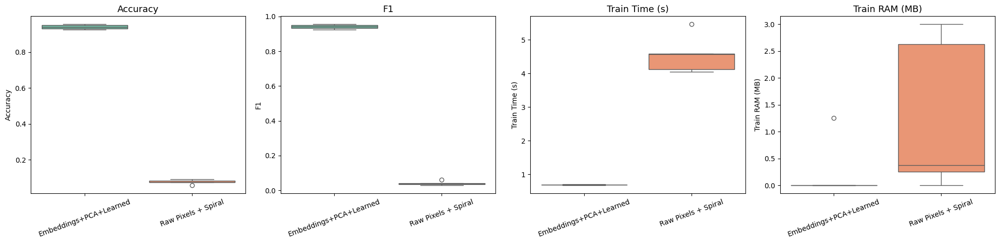

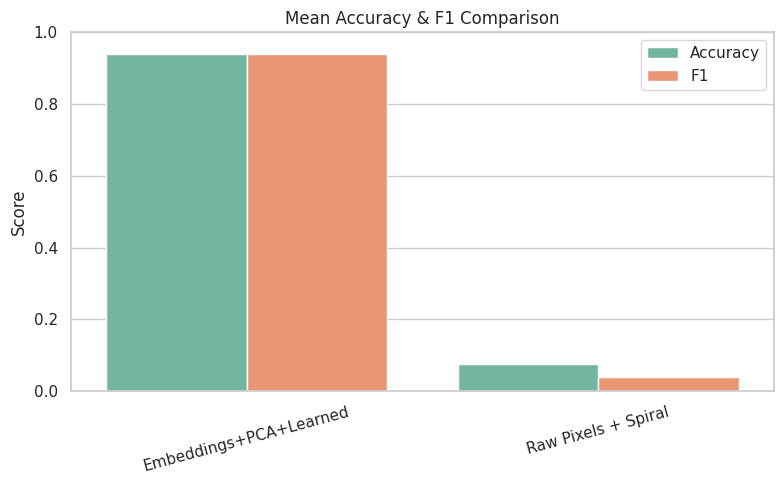

In [39]:
combined, summary = compare_results(metrics_emb, metrics_raw, save_path="bn_comparison")

## Final Result

In [ ]:
train_path = path + "/train"
embeddings, labels = load_embeddings(train_path, n_persons=100, imgs_per_person=300)

Extracting embeddings: 100%|██████████| 100/100 [12:15<00:00,  7.35s/it]


In [ ]:
np.savez_compressed("embeddings_labels.npz", embeddings=embeddings, labels=labels)

In [ ]:
data = np.load("embeddings_labels.npz")
embeddings = data["embeddings"]
labels = data["labels"]

### pgmpy - Discrete Bayesian Network

In [ ]:
metrics_bn, models_bn = cross_validate_discrete_bn(embeddings, labels, pca_dim=10, folds=5, export_file="bn_folds.csv")


=== Discrete BN: Fold 1 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Acc: 0.8072395009664383 
Prec: 0.8084815995119894 
Rec: 0.8063337990993563 
F1: 0.8058215249331024

=== Discrete BN: Fold 2 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Acc: 0.8063268892794376 
Prec: 0.8078767816628927 
Rec: 0.805029845492644 
F1: 0.8049652937073352

=== Discrete BN: Fold 3 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Acc: 0.8191564147627417 
Prec: 0.8186761436772332 
Rec: 0.8168536729860775 
F1: 0.8160097255471043

=== Discrete BN: Fold 4 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Acc: 0.79701230228471 
Prec: 0.7980786371673213 
Rec: 0.7956307405763008 
F1: 0.7952211952960501

=== Discrete BN: Fold 5 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Acc: 0.8031634446397188 
Prec: 0.8040680852341875 
Rec: 0.800322297234365 
F1: 0.8002062339428933


In [ ]:
bn_summarize = summarize(metrics_bn)


BN 5-fold CV results:
Acc: 0.807 ± 0.007
Prec: 0.807 ± 0.007
Rec: 0.805 ± 0.007
F1: 0.804 ± 0.007


### pgmpy - Linear Gaussian Bayesian Network

In [ ]:
metrics_lgbn, models_lgbn = cross_validate_lgbn(embeddings, labels, pca_dim=10, folds=5)


=== LGBN: Fold 1 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Acc: 0.010367246529608153 
Prec: 0.008765473524058872 
Rec: 0.010295834378666586 
F1: 0.005132015423229076

=== LGBN: Fold 2 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Acc: 0.012302284710017574 
Prec: 0.01053994049136987 
Rec: 0.01242836178496556 
F1: 0.006319253974081868

=== LGBN: Fold 3 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Acc: 0.012478031634446397 
Prec: 0.011436169677658686 
Rec: 0.012388907345884093 
F1: 0.005837413426008237

=== LGBN: Fold 4 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Acc: 0.01195079086115993 
Prec: 0.008988986126154192 
Rec: 0.012005280090198269 
F1: 0.005219749977135777

=== LGBN: Fold 5 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Acc: 0.01124780316344464 
Prec: 0.005998041818306601 
Rec: 0.011222222222222222 
F1: 0.003612984935676383


In [ ]:
lgbn_summarize = summarize(metrics_lgbn, name="LGBN")


LGBN 5-fold CV results:
Acc: 0.012 ± 0.001
Prec: 0.009 ± 0.002
Rec: 0.012 ± 0.001
F1: 0.005 ± 0.001


### pomegranate - Hidden Markov Model

In [ ]:
metrics_hmm, models_hmm = cross_validate_hmm(embeddings, labels, pca_dim=10, folds=5)


=== HMM: Fold 1 ===
Acc: 0.4976278334211914 
Prec: 0.49117226302513173 
Rec: 0.4969746427945687 
F1: 0.4723248086779694

=== HMM: Fold 2 ===
Acc: 0.49173989455184536 
Prec: 0.47853473042803346 
Rec: 0.48886935262753345 
F1: 0.4631185859876087

=== HMM: Fold 3 ===
Acc: 0.5279437609841828 
Prec: 0.5155620616604469 
Rec: 0.5295997579258054 
F1: 0.5037178313062232

=== HMM: Fold 4 ===
Acc: 0.4882249560632689 
Prec: 0.4649807269684588 
Rec: 0.4870136148092522 
F1: 0.4550610347135828

=== HMM: Fold 5 ===
Acc: 0.4938488576449912 
Prec: 0.48401970426396496 
Rec: 0.4929409427249574 
F1: 0.4675687291342796


In [ ]:
hmm_summarize = summarize(metrics_hmm, name="HMM")


HMM 5-fold CV results:
Acc: 0.500 ± 0.014
Prec: 0.487 ± 0.017
Rec: 0.499 ± 0.016
F1: 0.472 ± 0.017


### pomegranate - General Mixture Model

In [ ]:
metrics_gmm, models_gmm = cross_validate_gmm(embeddings, labels, pca_dim=10, folds=5)


=== GMM: Fold 1 ===
Acc: 0.8631172026005974 
Prec: 0.8631181403148759 
Rec: 0.8633129888806161 
F1: 0.8615108412507135

=== GMM: Fold 2 ===
Acc: 0.8630931458699472 
Prec: 0.8646307231066716 
Rec: 0.8624646872056182 
F1: 0.8622185955319966

=== GMM: Fold 3 ===
Acc: 0.8745166959578208 
Prec: 0.874708525828671 
Rec: 0.8731900698918422 
F1: 0.8726177672762254

=== GMM: Fold 4 ===
Acc: 0.8571177504393673 
Prec: 0.8595612738197609 
Rec: 0.85644740603204 
F1: 0.8566168980535313

=== GMM: Fold 5 ===
Acc: 0.8653778558875219 
Prec: 0.8672205376449138 
Rec: 0.8653003069132668 
F1: 0.8650997496512255


In [ ]:
gmm_summarize = summarize(metrics_gmm, name="GMM")


GMM 5-fold CV results:
Acc: 0.865 ± 0.006
Prec: 0.866 ± 0.005
Rec: 0.864 ± 0.005
F1: 0.864 ± 0.005


### Comparison

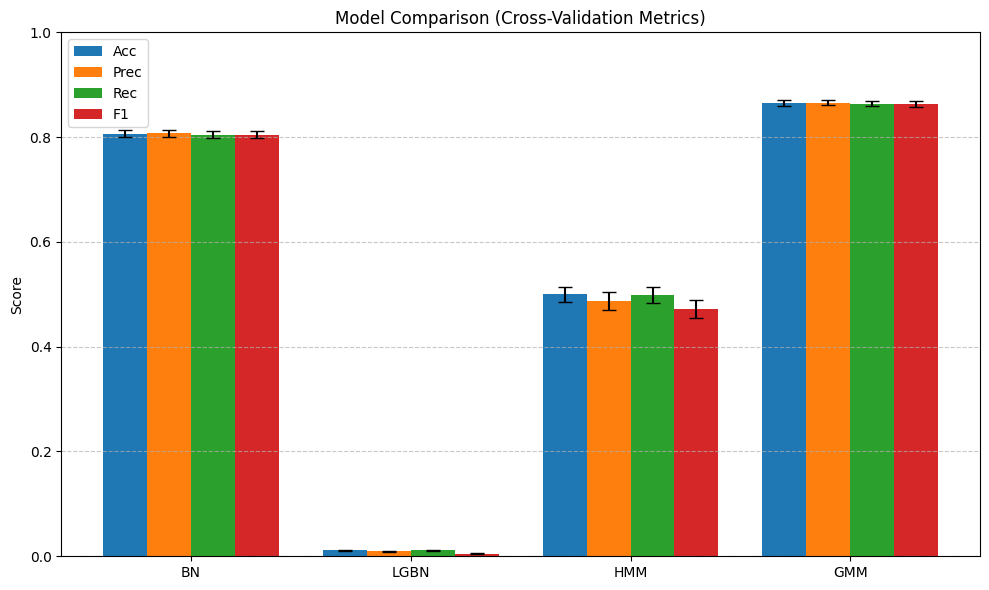

In [ ]:
plot_model_comparison([bn_summarize, lgbn_summarize, hmm_summarize, gmm_summarize])

## Face Identification

In [ ]:
import random
import numpy as np

def demo_face_identification(data_path, n_samples=5,
                             bn_model=None, lgbn_model=None,
                             gmm_model=None, hmm_model=None):
    image_paths = glob(os.path.join(data_path, "*/*.jpg"))
    chosen = random.sample(image_paths, min(n_samples, len(image_paths)))

    fig, axes = plt.subplots(1, len(chosen), figsize=(5 * len(chosen), 5))

    for ax, img_path in zip(axes, chosen):
        img = Image.open(img_path).convert("RGB")
        emb = get_embedding(img_path).reshape(1, -1)

        results = []

        # ----- Discrete BN -----
        if bn_model:
            pca_bn = bn_model["pca"]
            enc_bn = bn_model["disc_enc"]
            infer_bn = bn_model["infer"]
            features_bn = bn_model["features"]
            state_names = bn_model["state_names"]

            x_pca_bn = pca_bn.transform(emb)
            x_disc = enc_bn.transform(x_pca_bn).astype(int)[0]
            row_disc = pd.DataFrame([x_disc], columns=features_bn)

            obs = {f: int(row_disc.iloc[0][f]) for f in features_bn}
            q = infer_bn.query(variables=["Identity"], evidence=obs, show_progress=False)
            vals, order = q.values.flatten(), q.state_names["Identity"]
            probs = np.array([vals[order.index(s)] if s in order else 0 for s in state_names["Identity"]])
            pred_bn = state_names["Identity"][np.argmax(probs)]
            conf_bn = np.max(probs)
            results.append(f"BN: {pred_bn} ({conf_bn:.2f})")

        # ----- LGBN -----
        if lgbn_model:
            pca_lgbn = lgbn_model["pca"]
            lgbn = lgbn_model["lgbn"]
            features_lgbn = lgbn_model["features"]
            identities = lgbn_model["identities"]
            id_map = lgbn_model["id_map"]

            x_pca_lgbn = pca_lgbn.transform(emb)
            row_cont = pd.DataFrame(x_pca_lgbn, columns=features_lgbn)
            pred_lgbn = predict_lgbn(lgbn, features_lgbn, identities, id_map, row_cont.iloc[0])

            # Likelihoods = confidence
            likelihoods = []
            for identity in identities:
                identity_num = id_map[identity]
                log_prob = 0.0
                for cpd in lgbn.cpds:
                    if isinstance(cpd, LinearGaussianCPD) and cpd.variable in features_lgbn:
                        f = cpd.variable
                        x_val = row_cont.iloc[0][f]
                        beta = cpd.beta[0] if len(cpd.beta) > 0 else 0.0
                        std = cpd.std
                        mean = beta * identity_num
                        log_prob += -0.5 * np.log(2 * np.pi * std**2) - ((x_val - mean) ** 2) / (2 * std**2)
                likelihoods.append(log_prob)

            conf_lgbn = np.exp(likelihoods - np.max(likelihoods))
            conf_lgbn = conf_lgbn / conf_lgbn.sum()
            results.append(f"LGBN: {pred_lgbn} ({np.max(conf_lgbn):.2f})")

        # ----- GMM -----
        if gmm_model:
            pca_gmm = gmm_model["pca"]
            models = gmm_model["models"]
            x_pca_gmm = pca_gmm.transform(emb)

            scores = {identity: model.log_probability(x_pca_gmm)
                      for identity, model in models.items()}
            identities = list(scores.keys())
            log_probs = np.array(list(scores.values()))

            probs = np.exp(log_probs - np.max(log_probs))
            probs /= probs.sum()

            pred_gmm = identities[np.argmax(probs)]
            conf_gmm = np.max(probs)
            results.append(f"GMM: {pred_gmm} ({conf_gmm:.2f})")

        # ----- HMM -----
        if hmm_model:
            pca_hmm = hmm_model["pca"]
            models = hmm_model["models"]

            x_pca_hmm = pca_hmm.transform(emb)
            seq = x_pca_hmm[:, [0]].reshape(1, -1, 1)

            scores = {identity: model.log_probability(seq)
              for identity, model in models.items()}
            identities = list(scores.keys())
            log_probs = np.array(list(scores.values()))

            probs = np.exp(log_probs - np.max(log_probs))
            probs /= probs.sum()

            pred_hmm = identities[np.argmax(probs)]
            conf_hmm = np.max(probs)
            results.append(f"HMM: {pred_hmm} ({conf_hmm:.2f})")

        # ----- Plot -----
        ax.imshow(img)
        ax.set_title("\n".join(results))
        ax.axis("off")

    plt.show()

In [ ]:
best_bn = models_bn[np.argmax(metrics_bn[:, 0])]
best_lgbn = models_lgbn[np.argmax(metrics_lgbn[:, 0])]
best_hmm = models_hmm[np.argmax(metrics_hmm[:, 0])]
best_gmm = models_gmm[np.argmax(metrics_gmm[:, 0])]

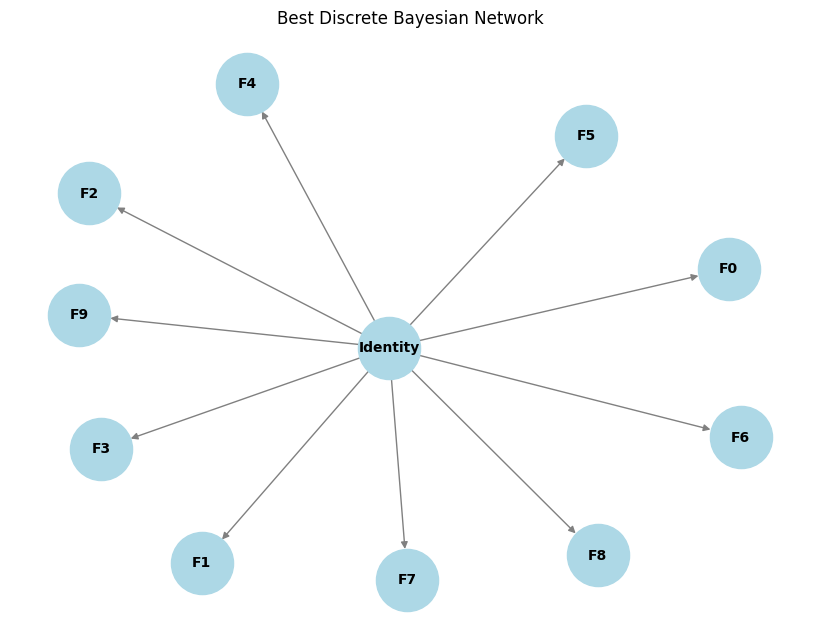

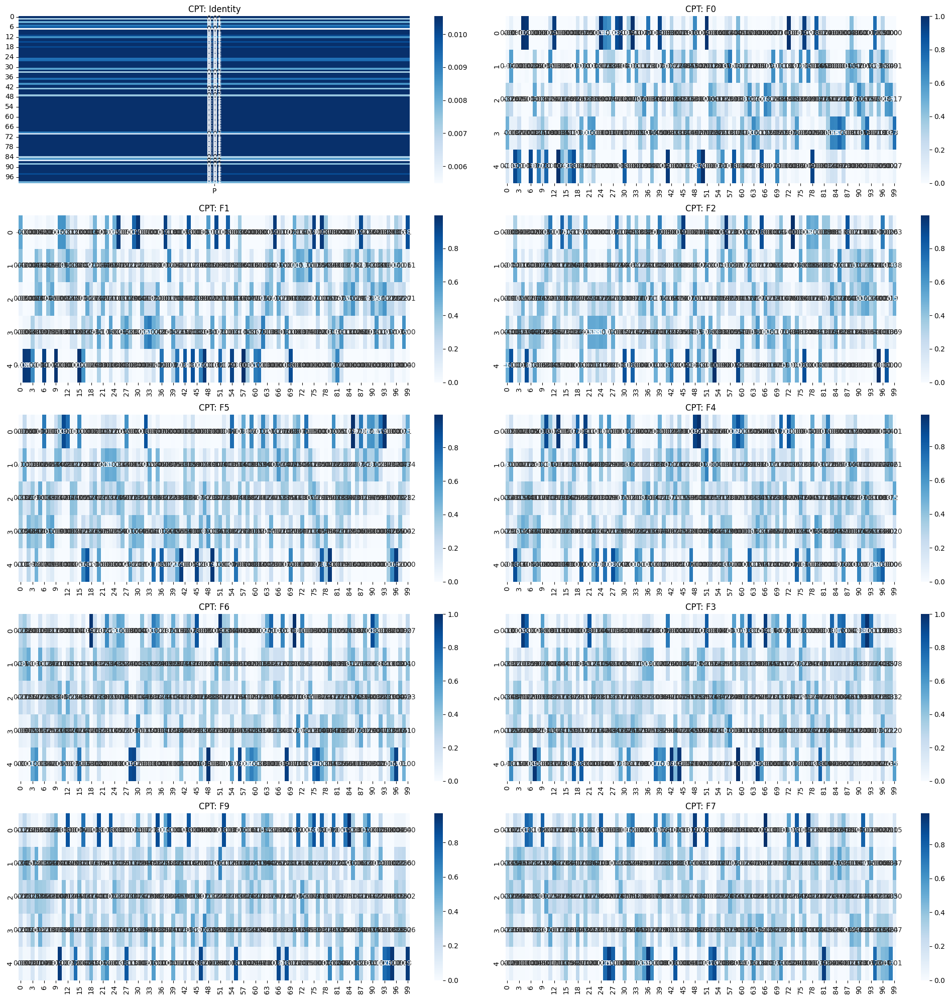

In [ ]:
plot_bn_structure(best_bn["bn"], title=f"Best Discrete Bayesian Network")
plot_bn_cpts(best_bn["bn"], max_vars=100)

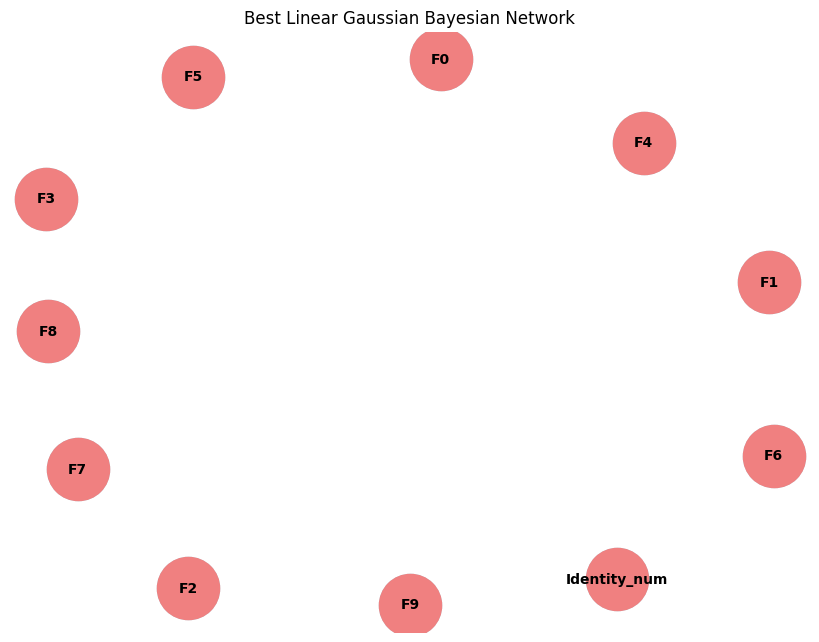

In [ ]:
plot_bn_structure(best_lgbn["lgbn"], title=f"Best Linear Gaussian Bayesian Network")

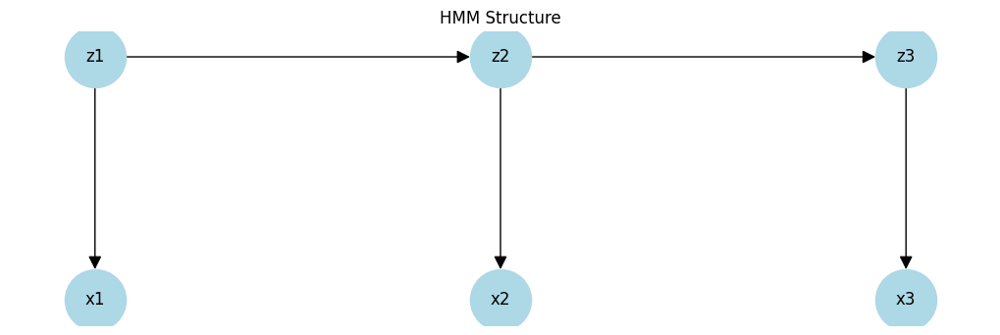

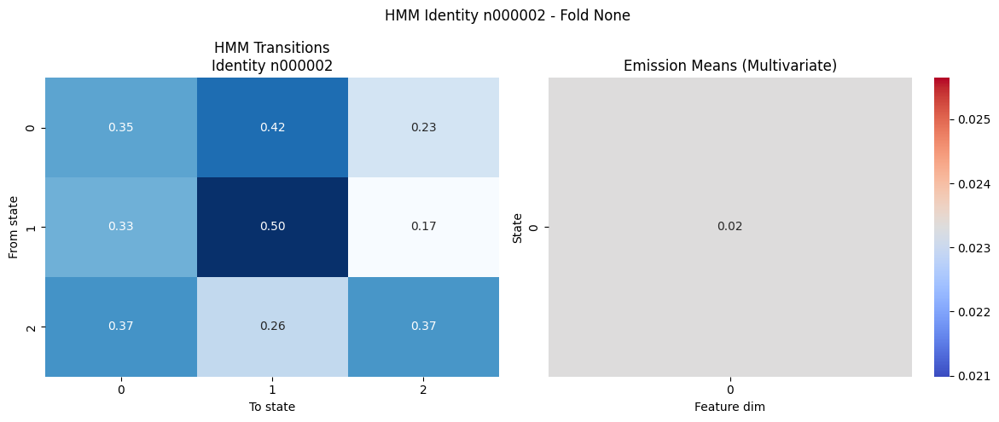

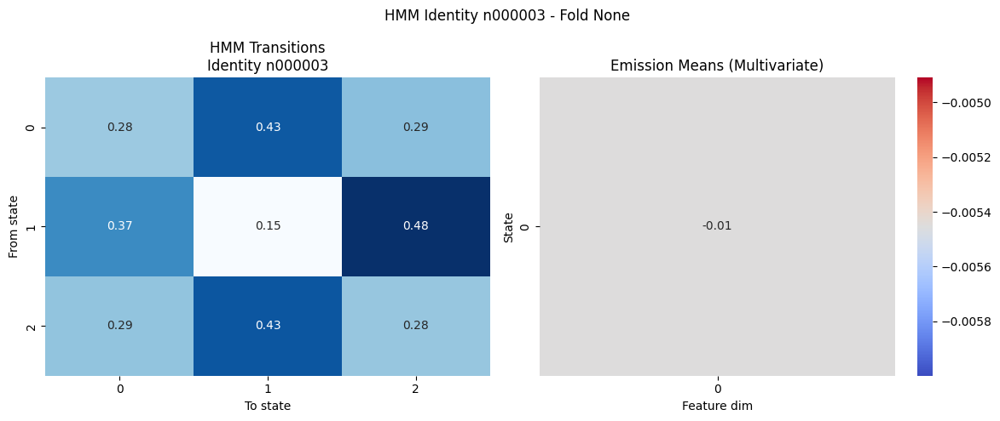

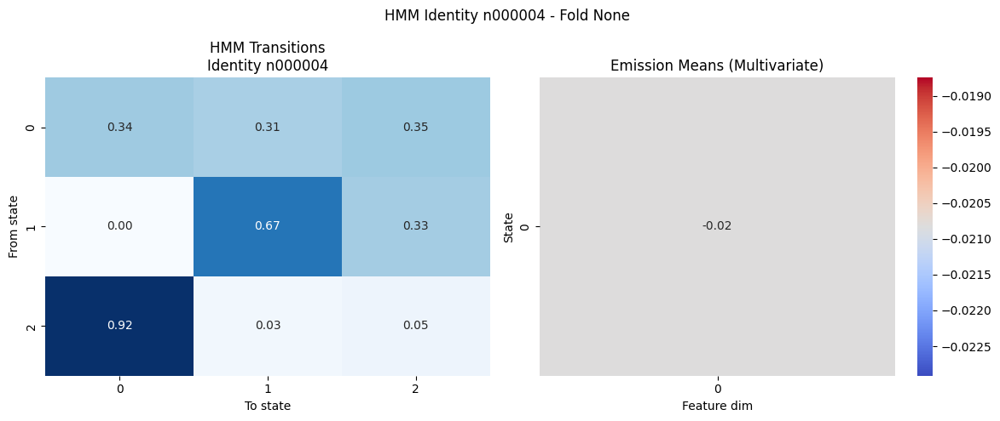

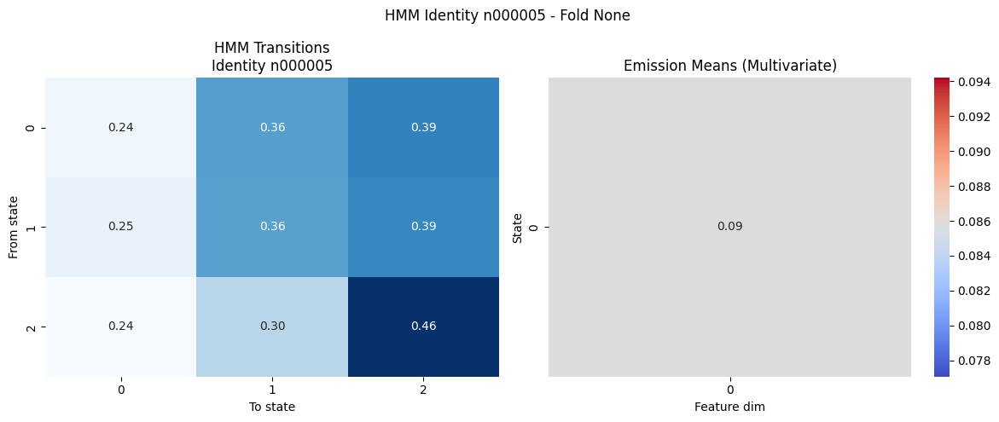

...

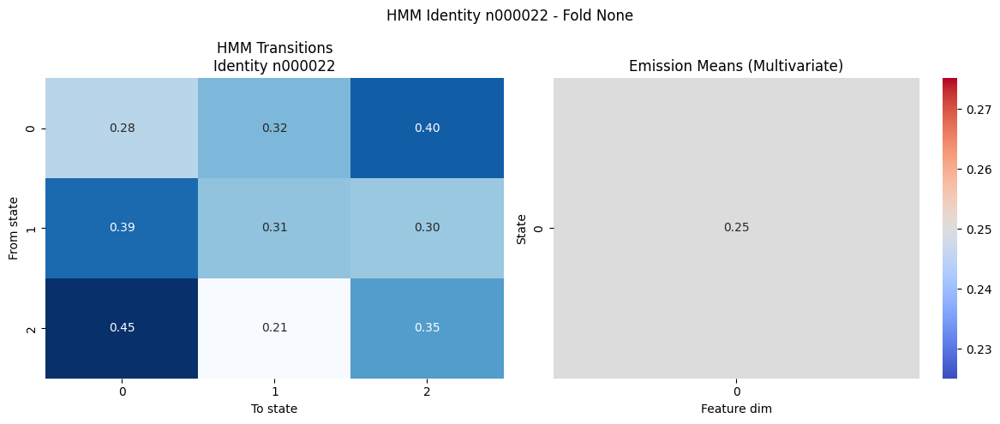

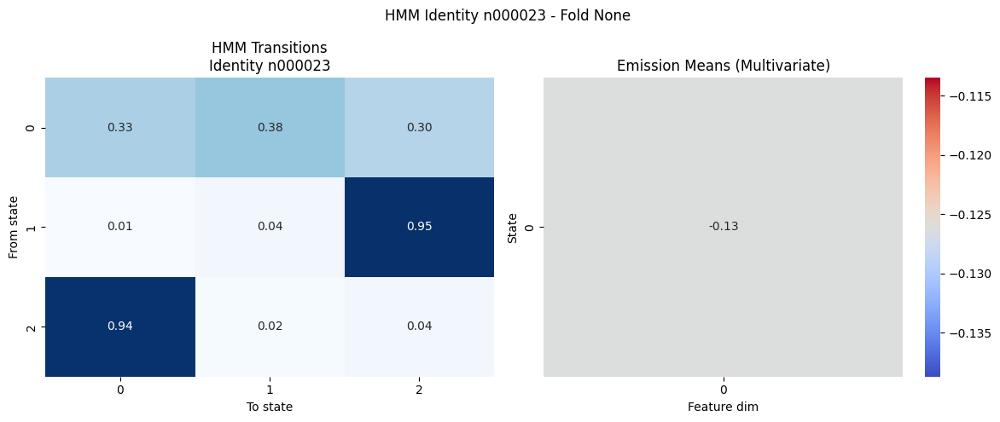

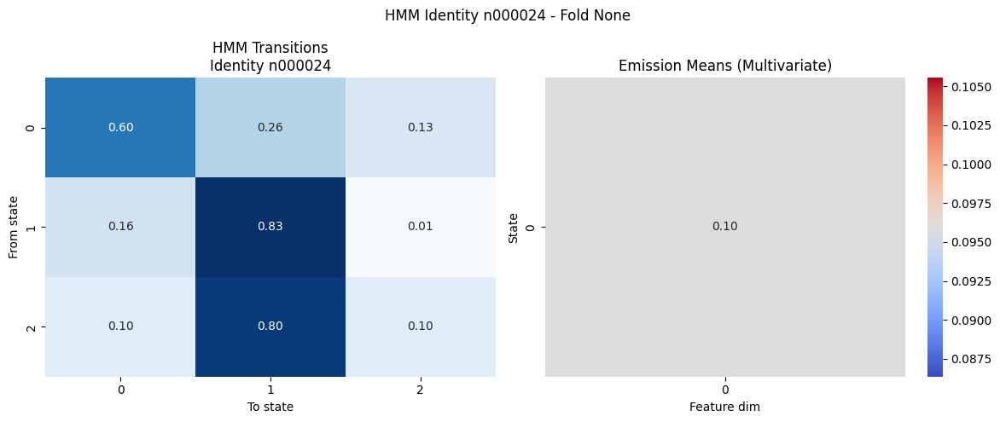

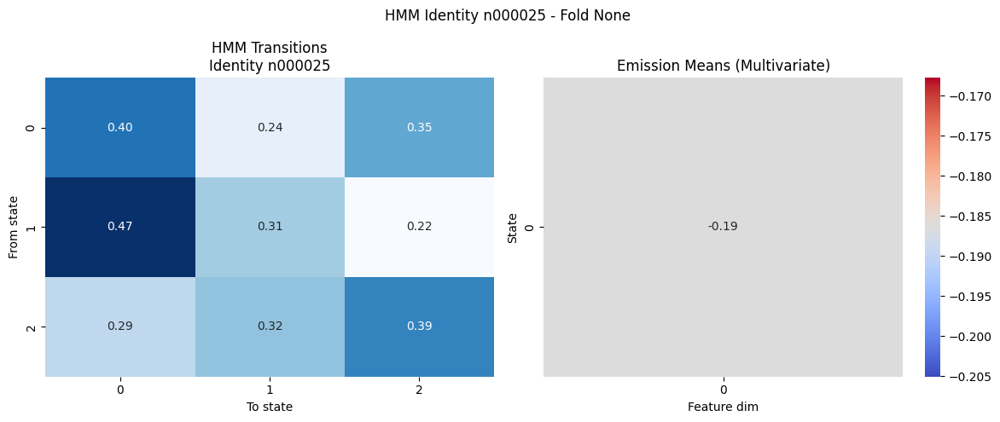

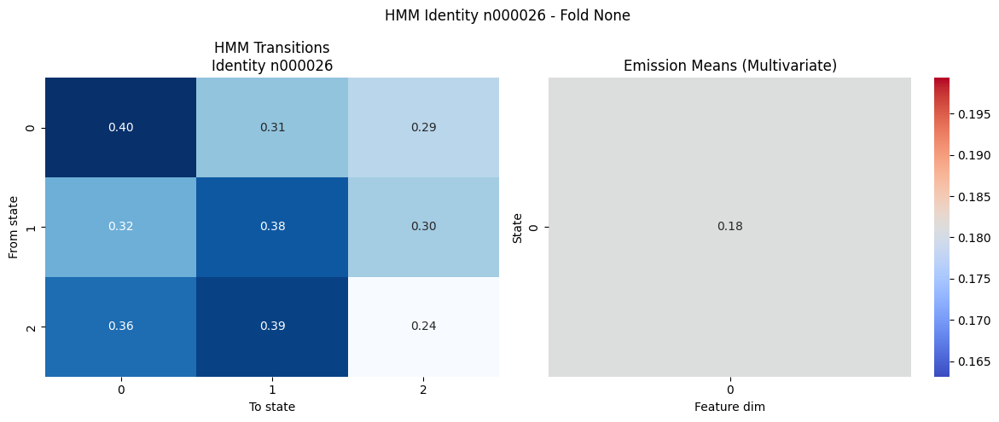

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


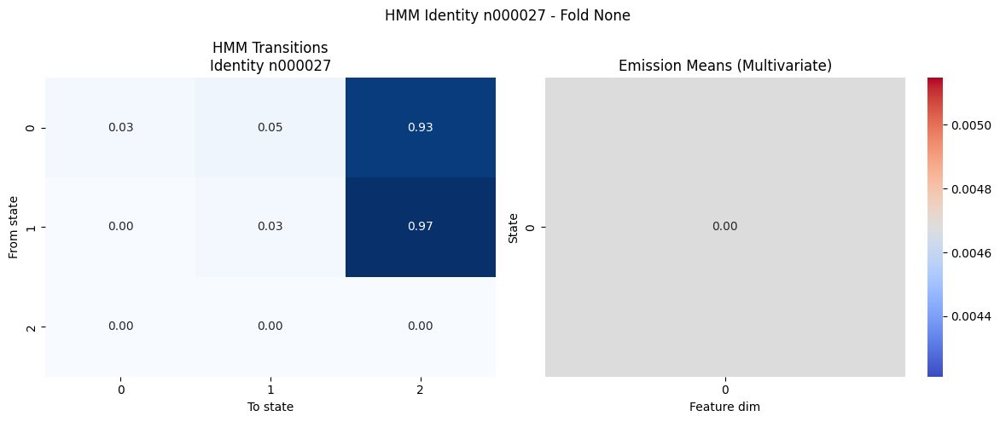

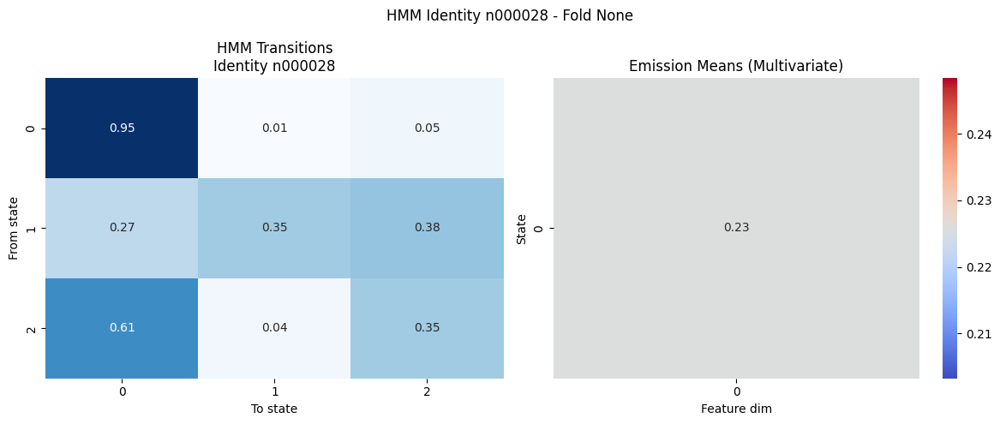

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


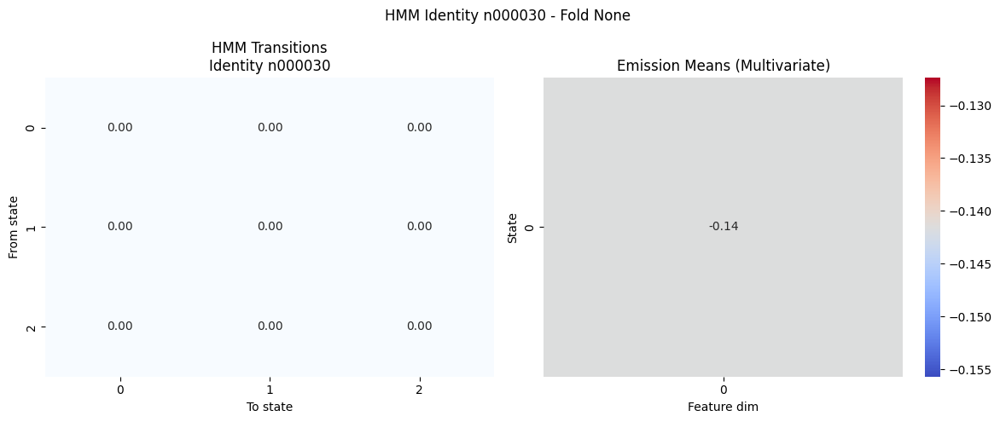

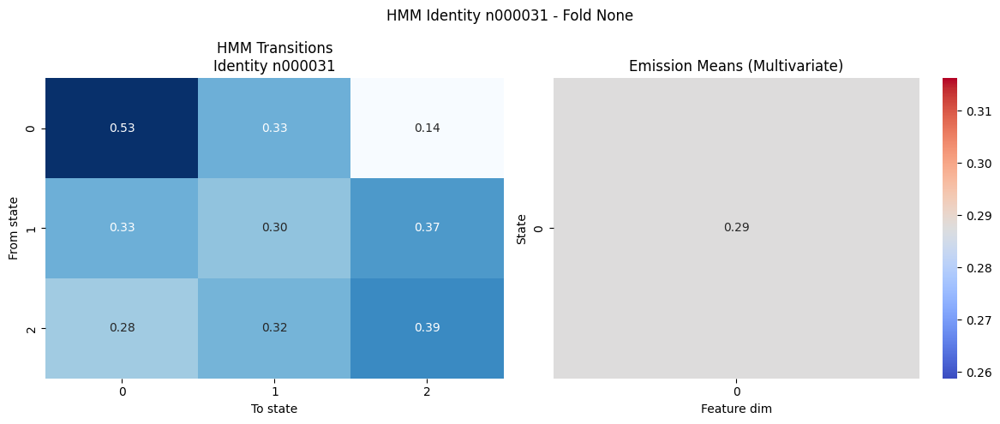

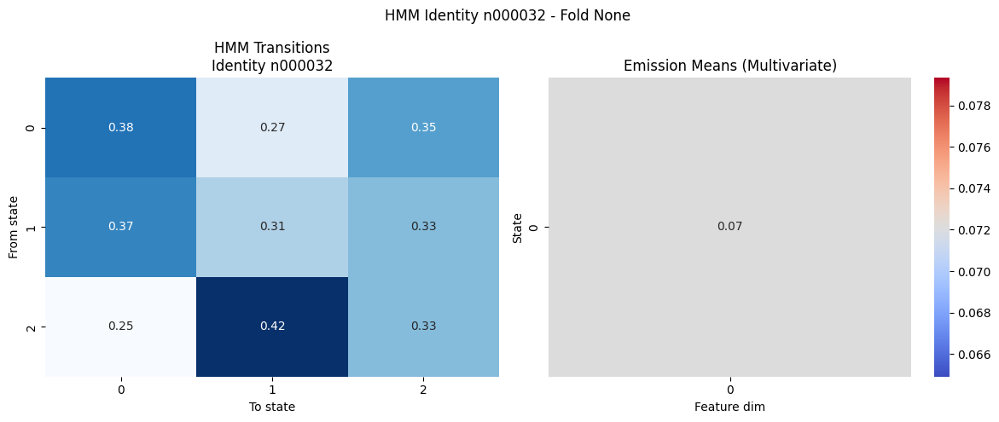

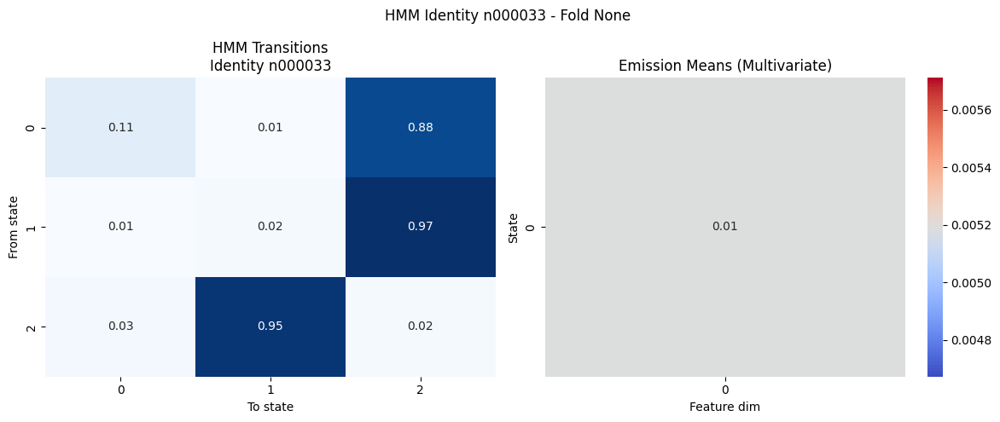

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


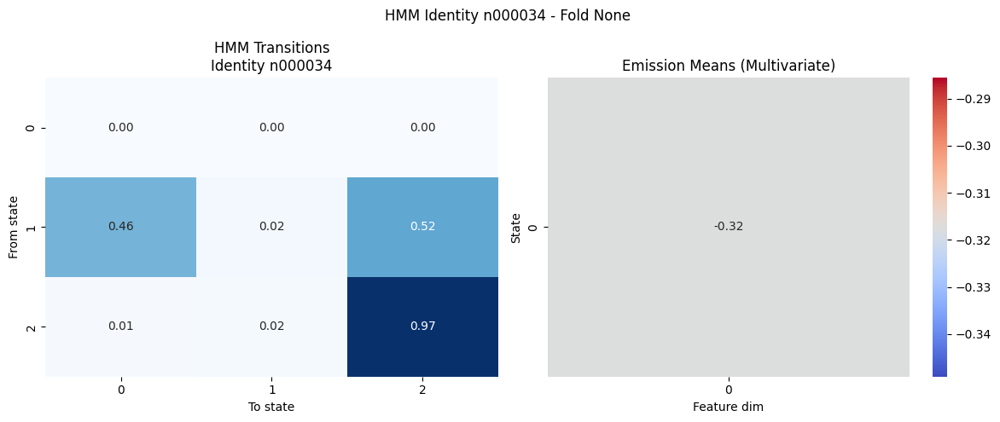

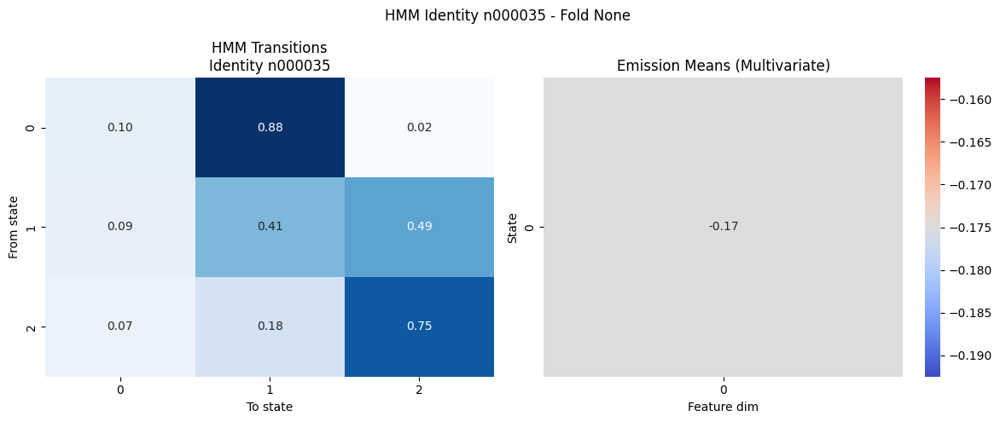

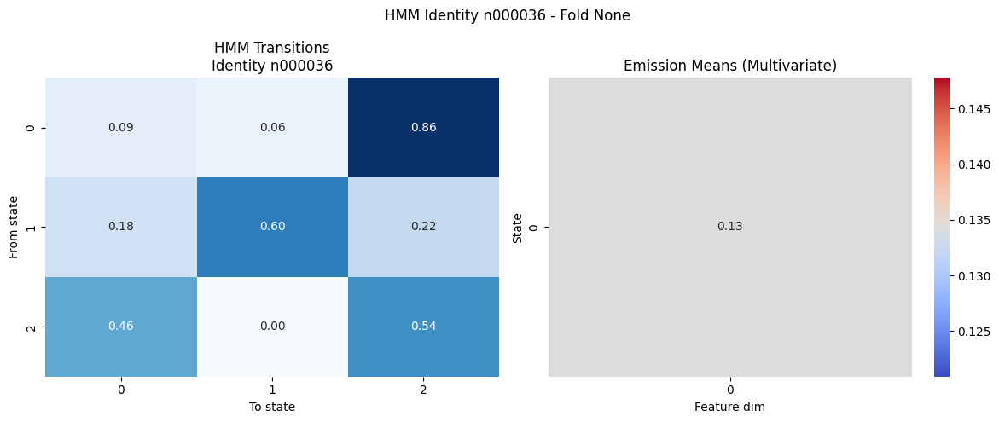

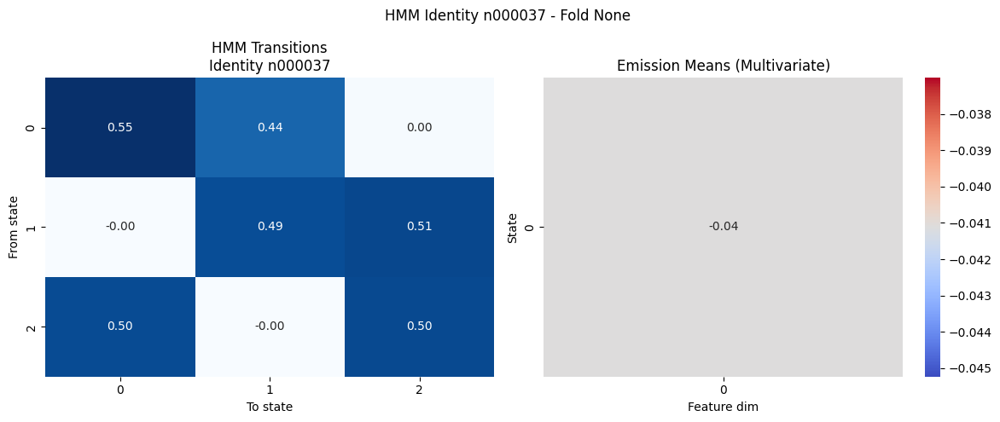

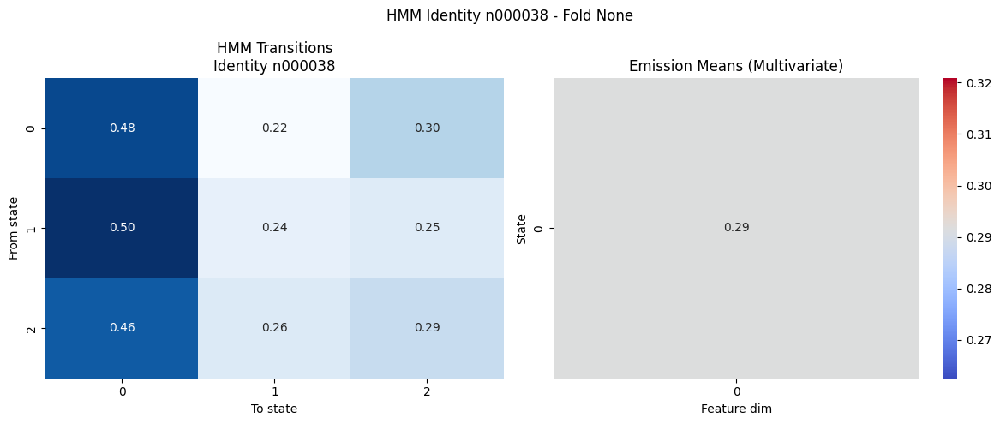

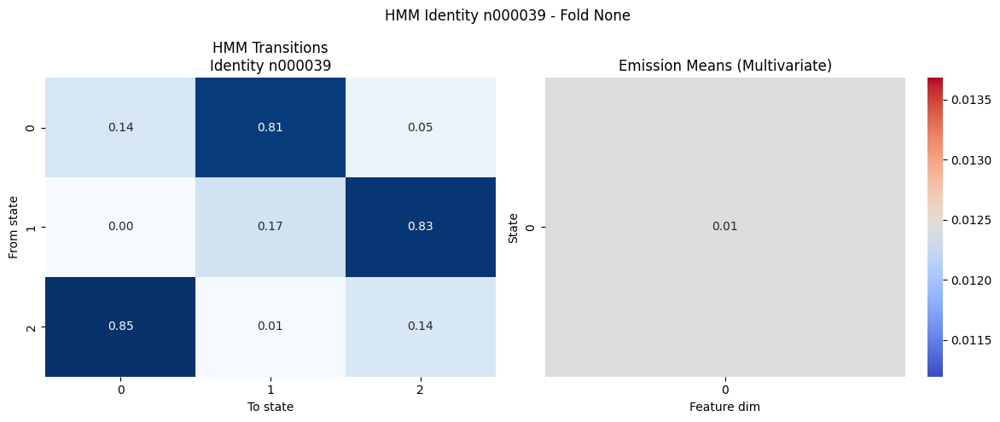

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


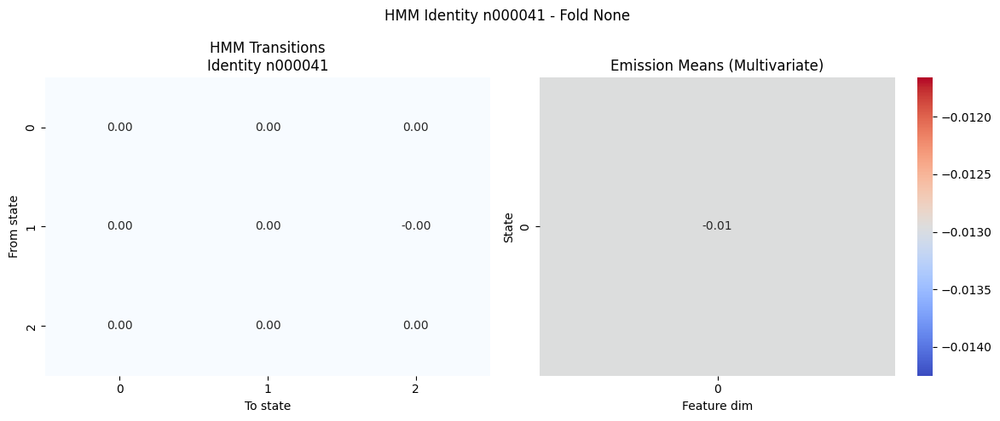

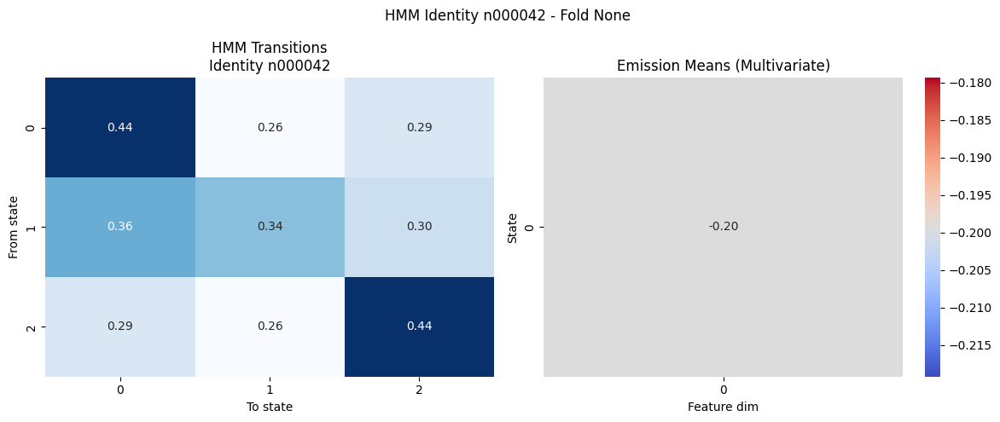

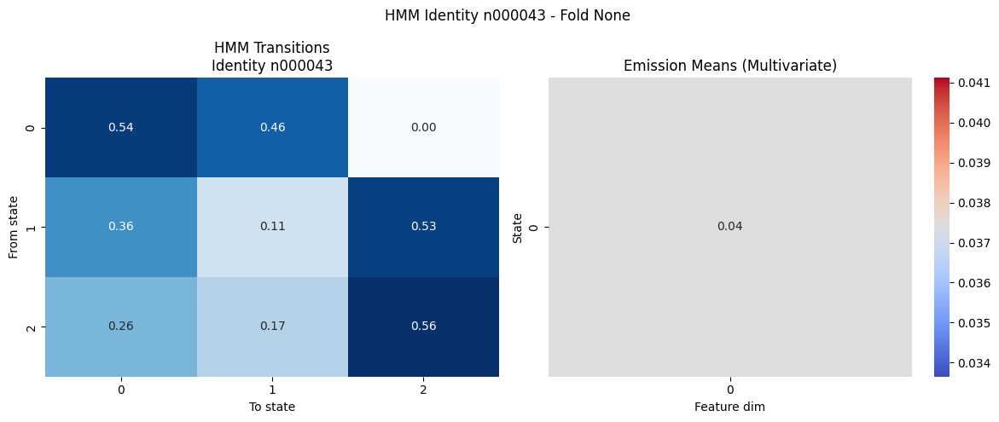

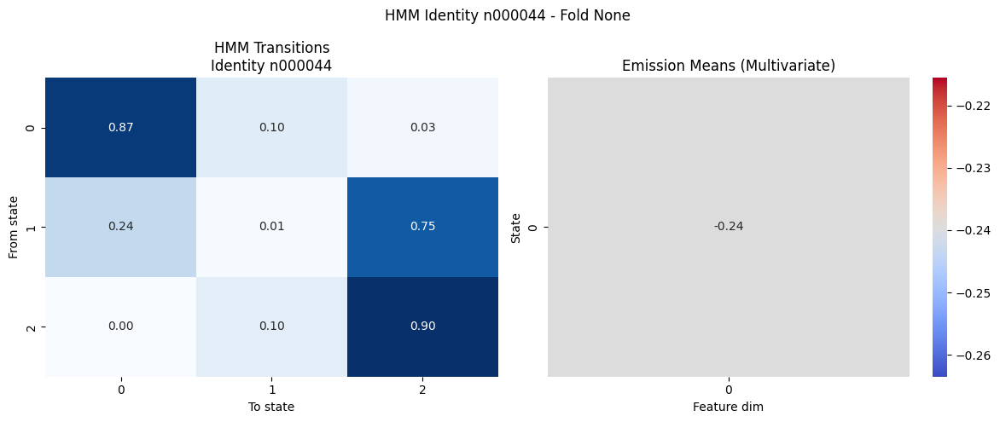

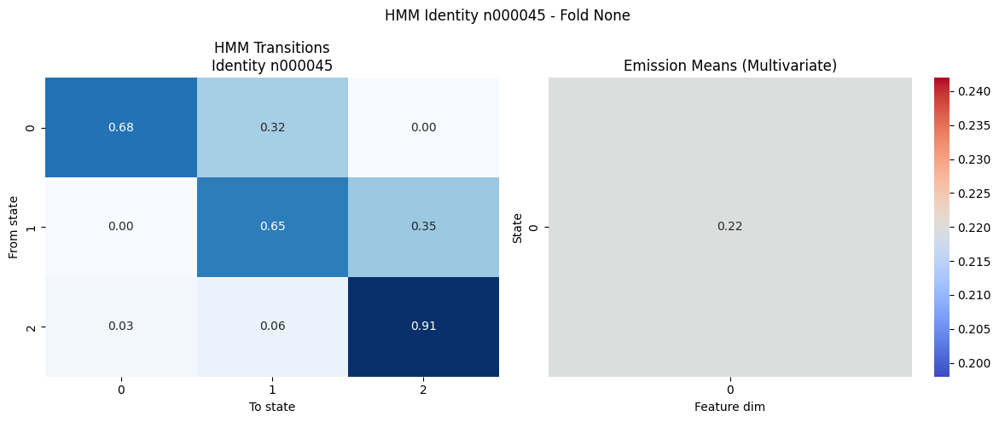

...

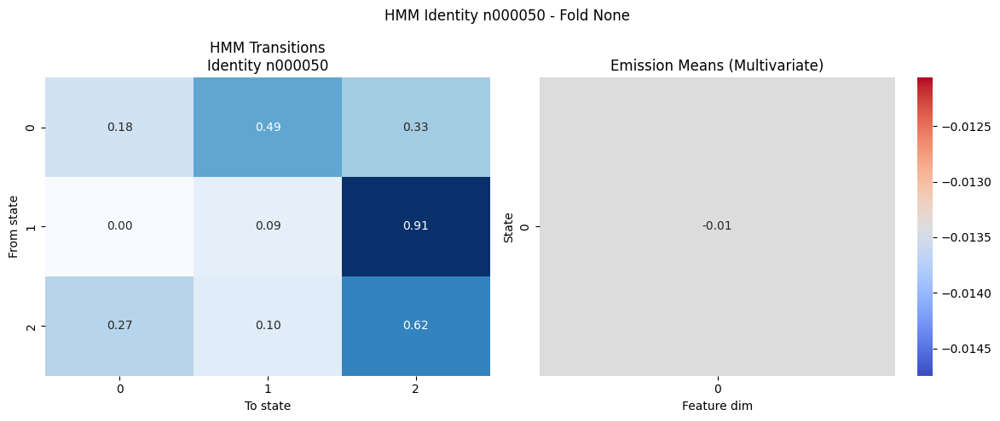

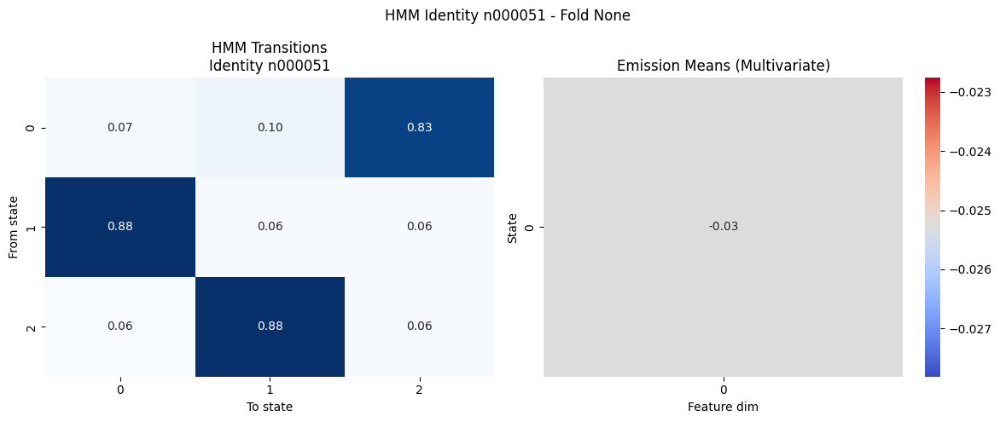

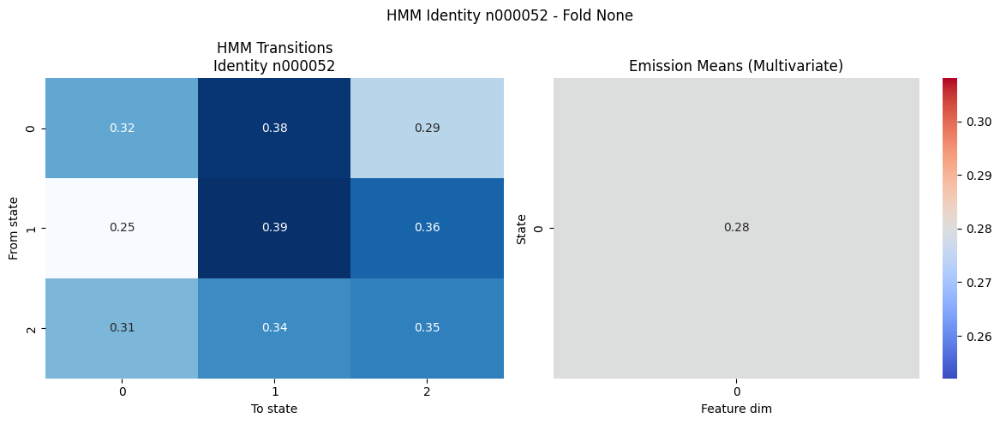

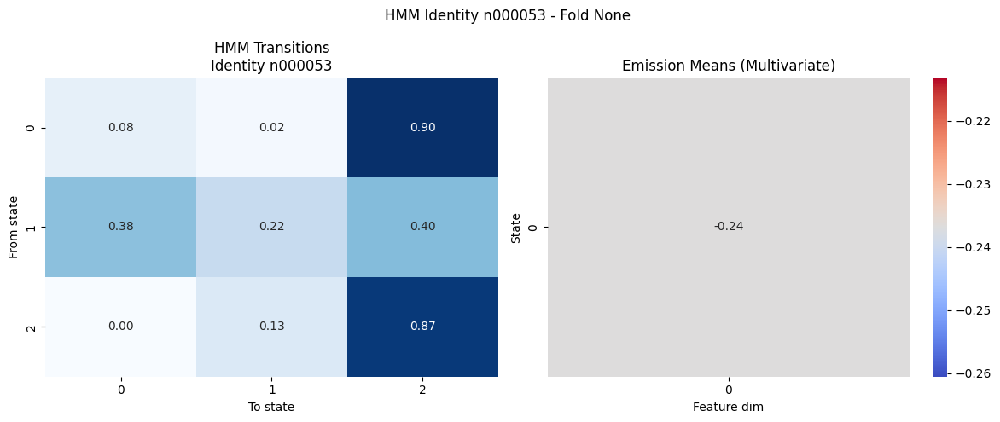

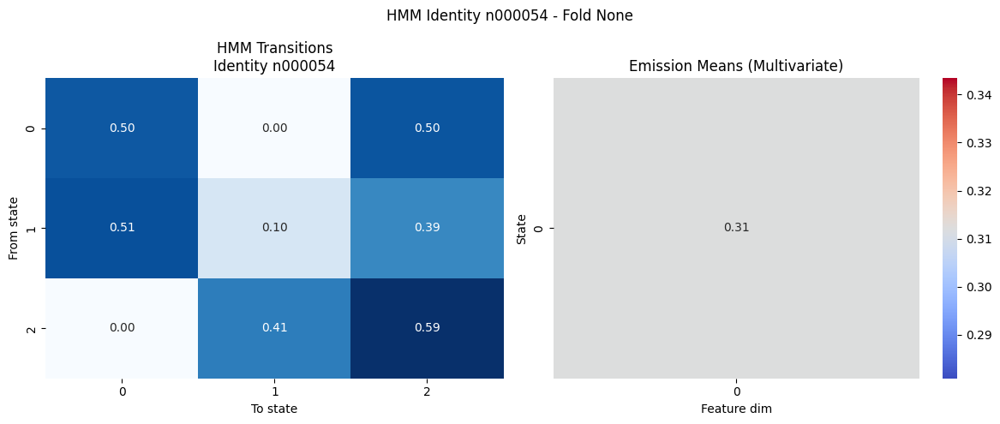

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


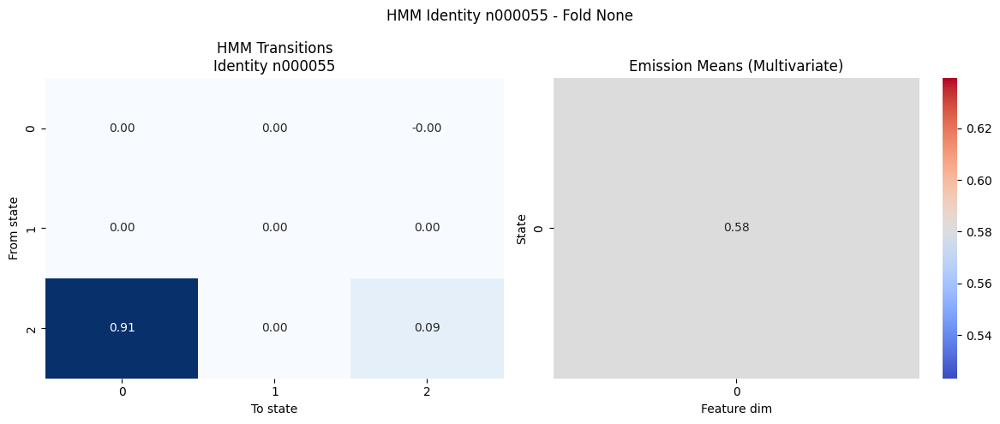

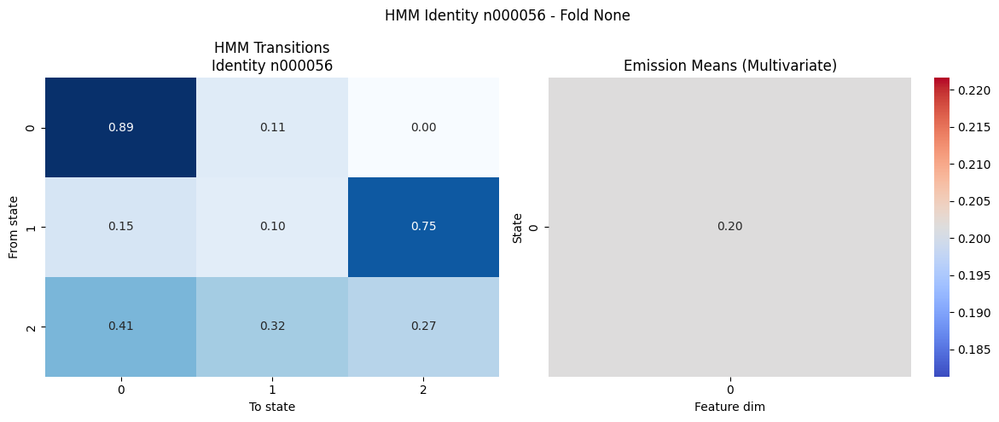

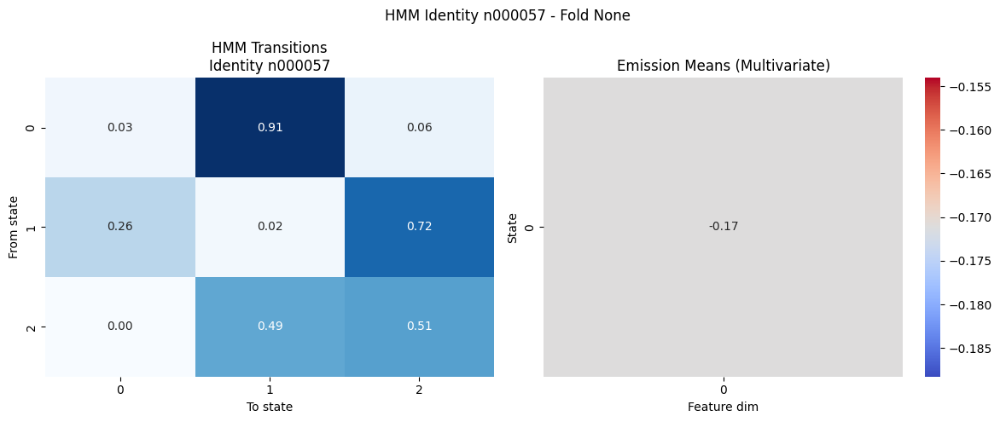

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


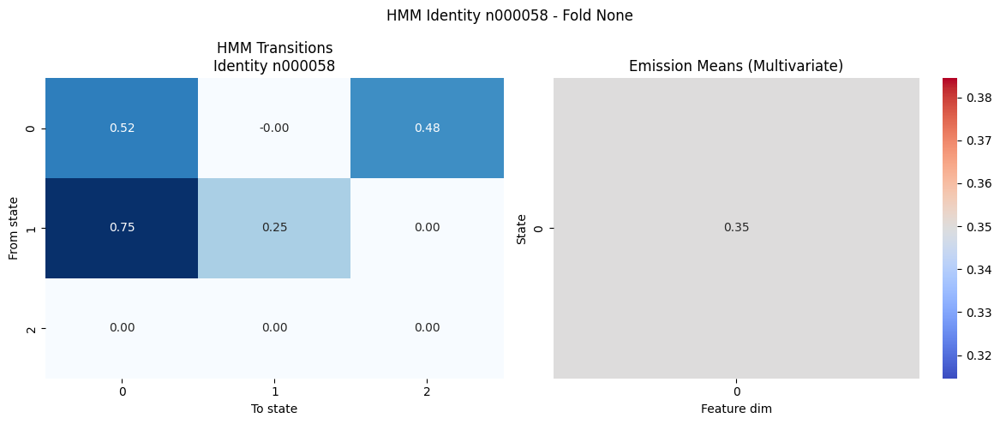

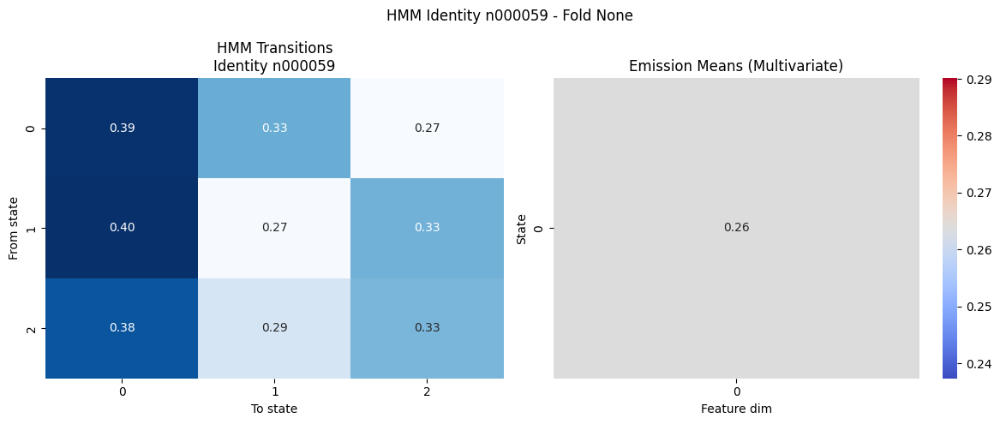

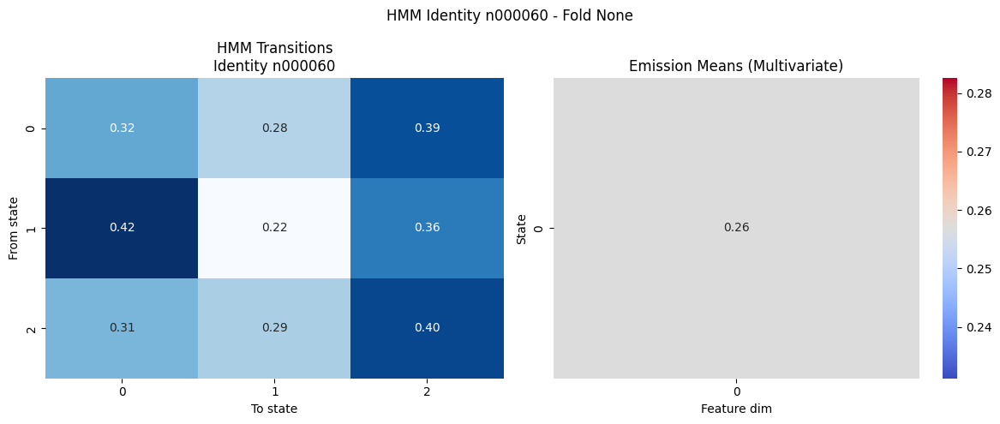

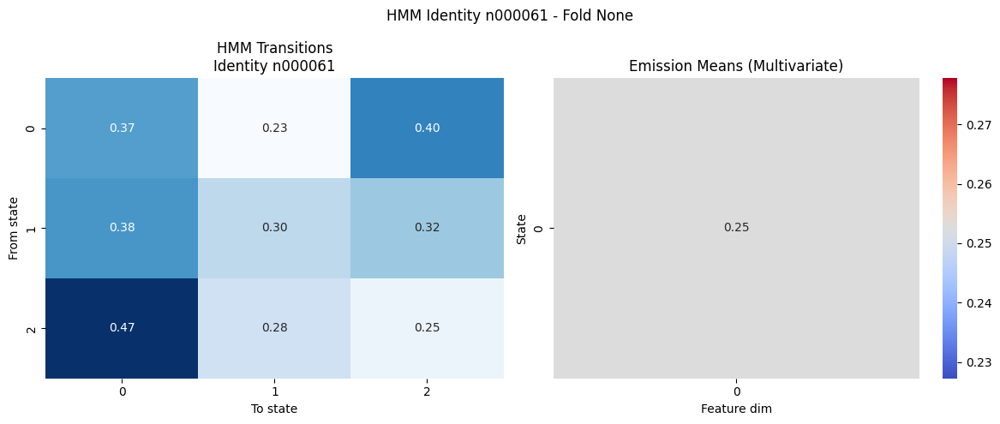

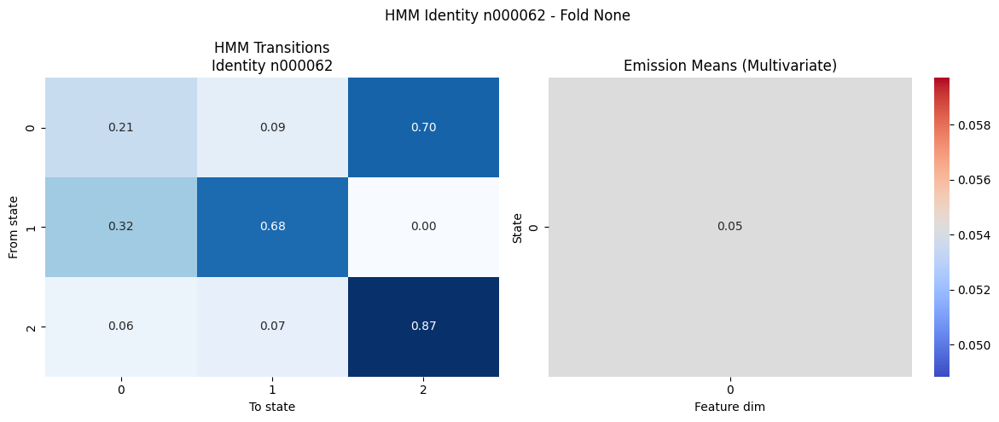

...

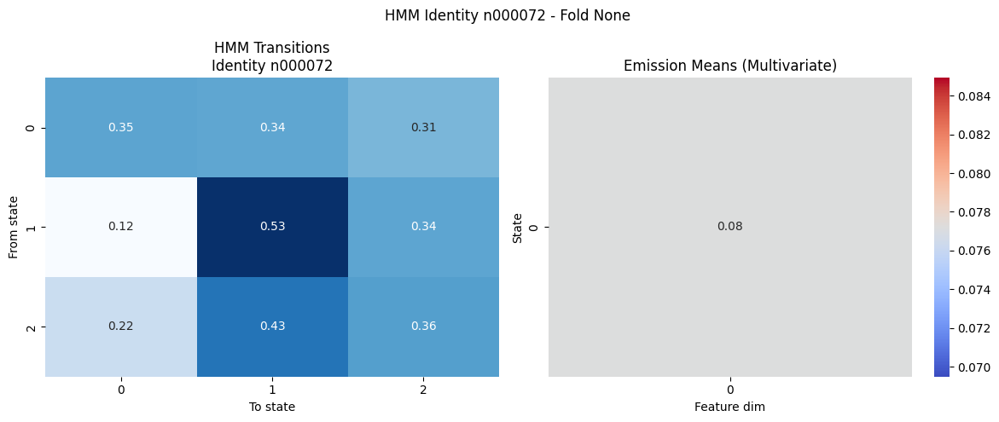

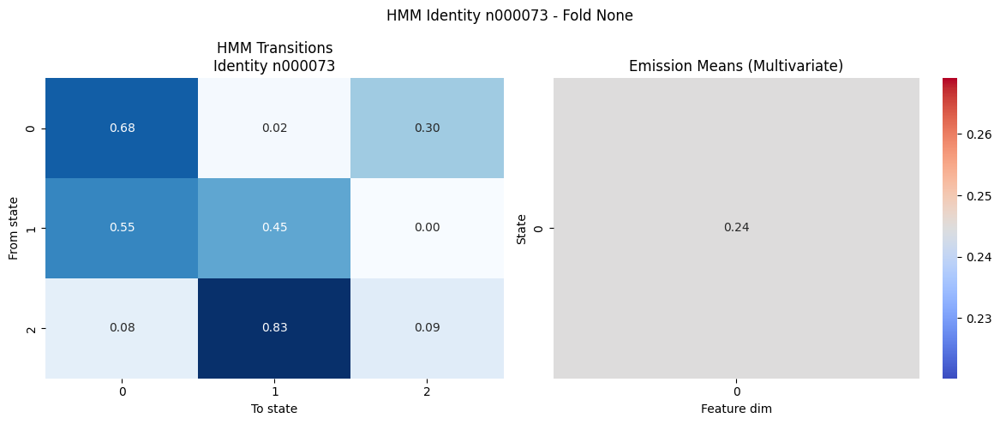

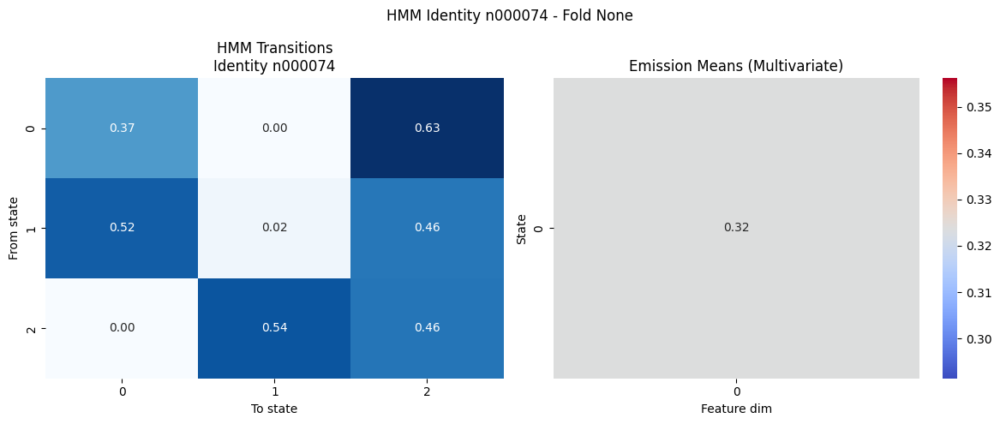

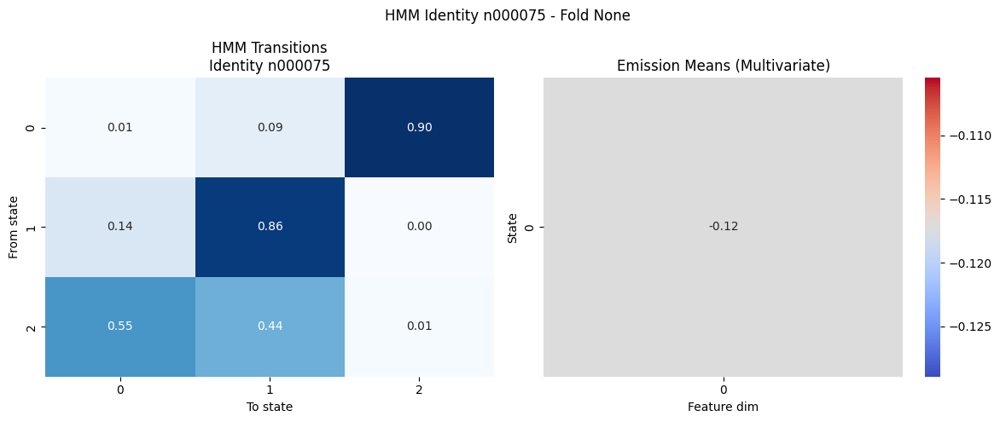

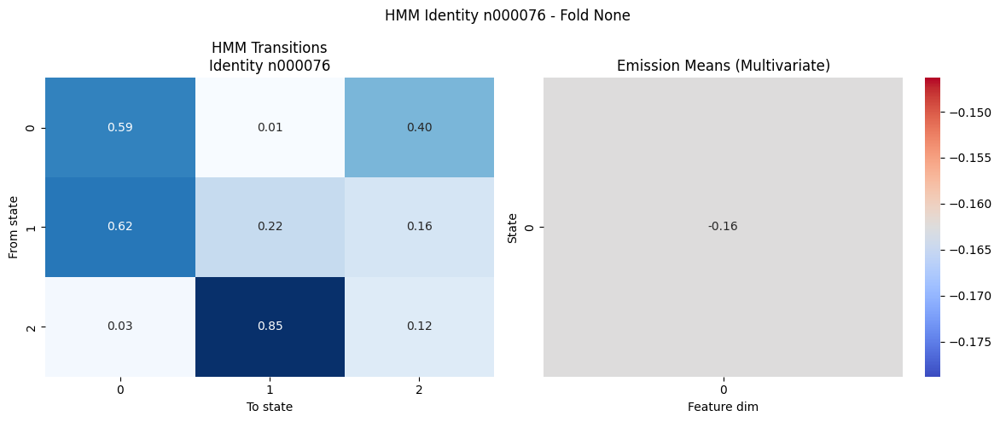

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


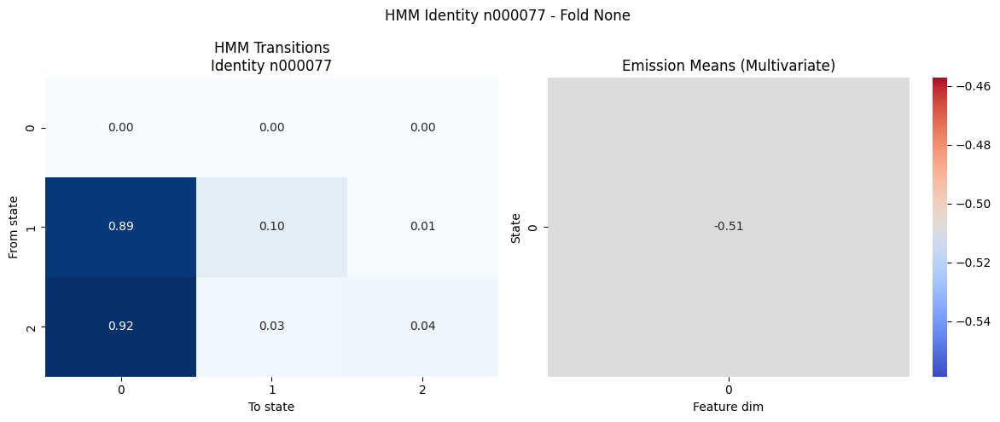

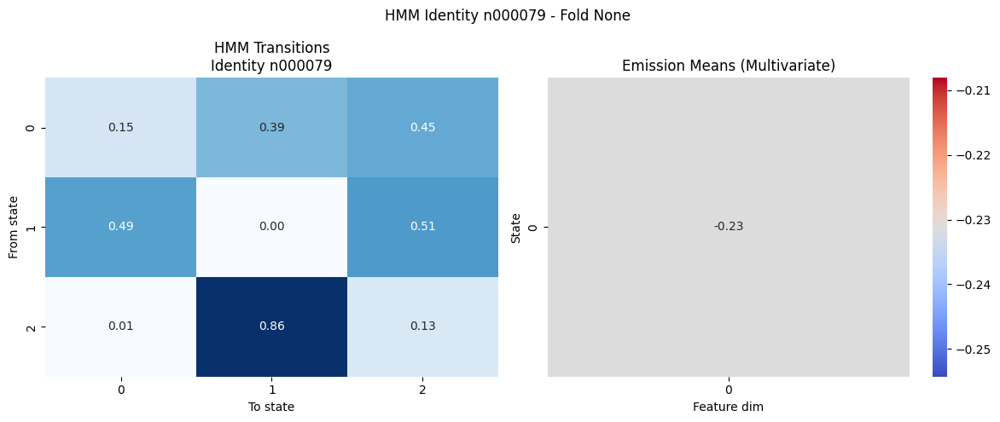

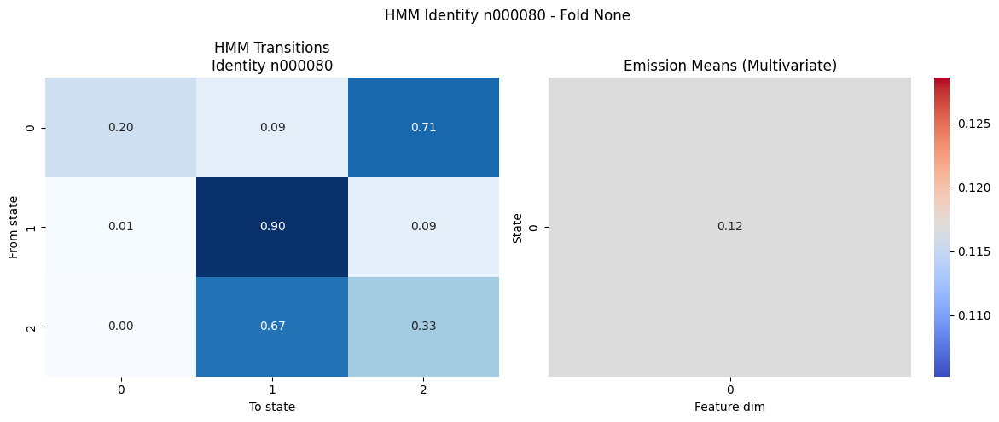

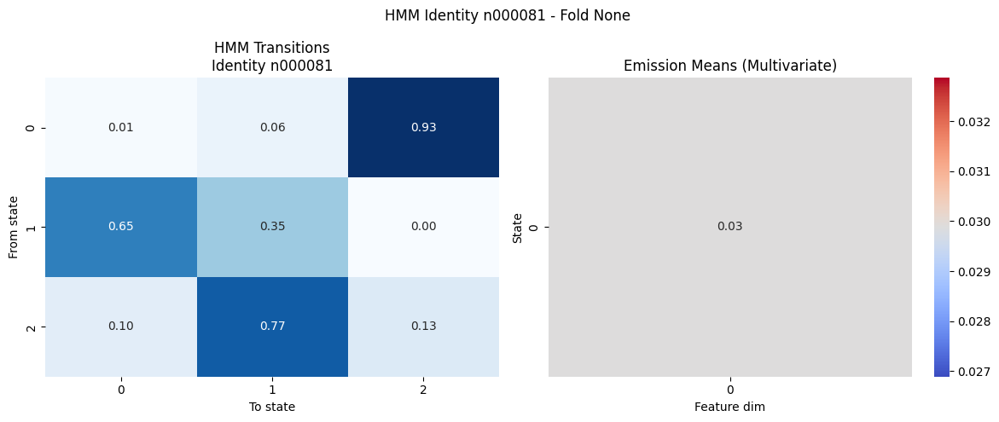

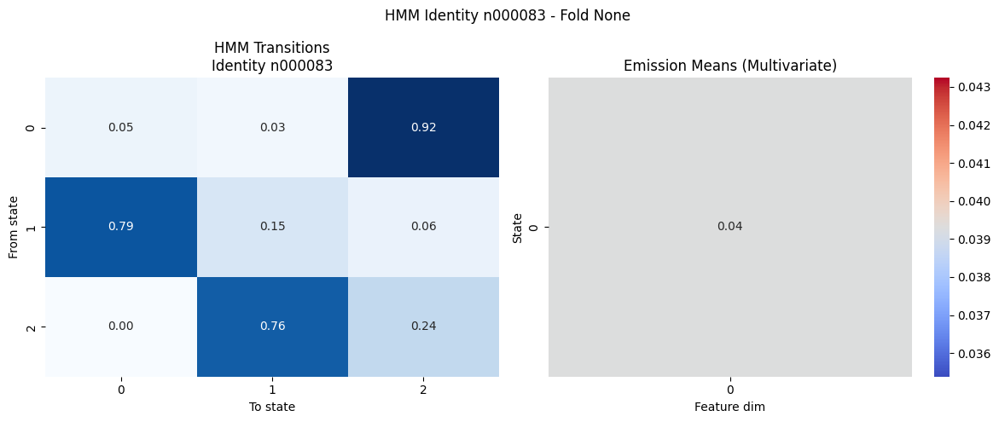

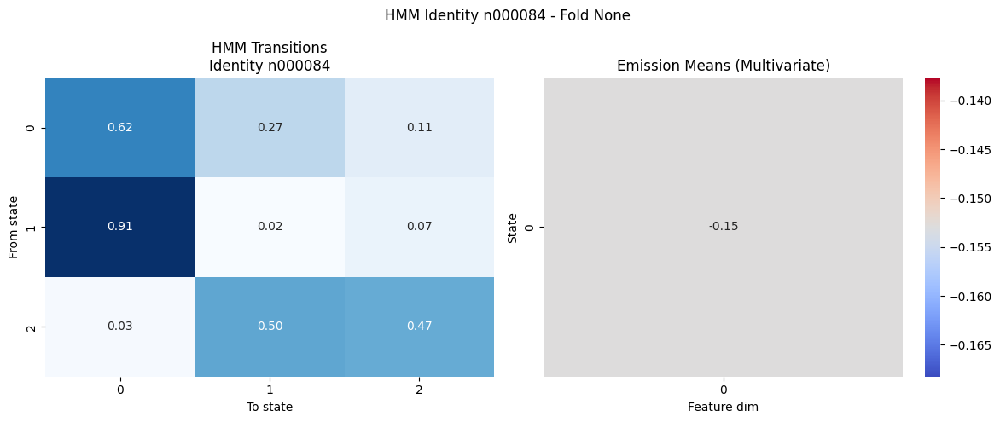

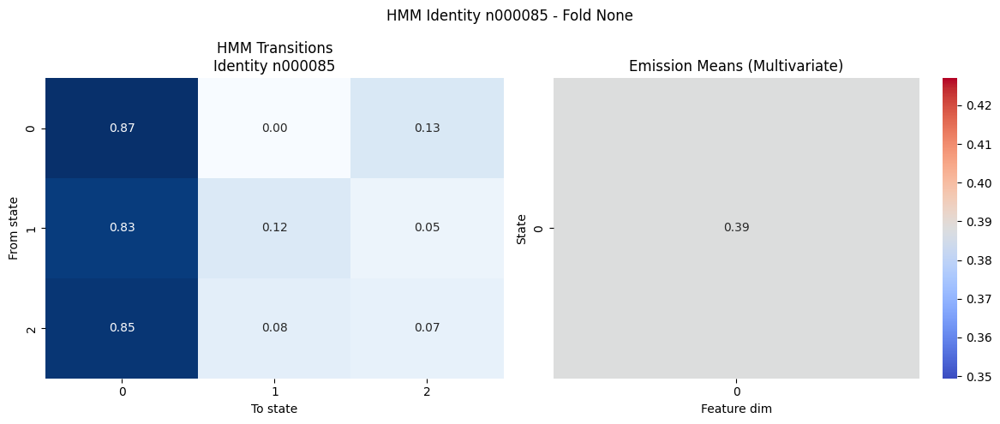

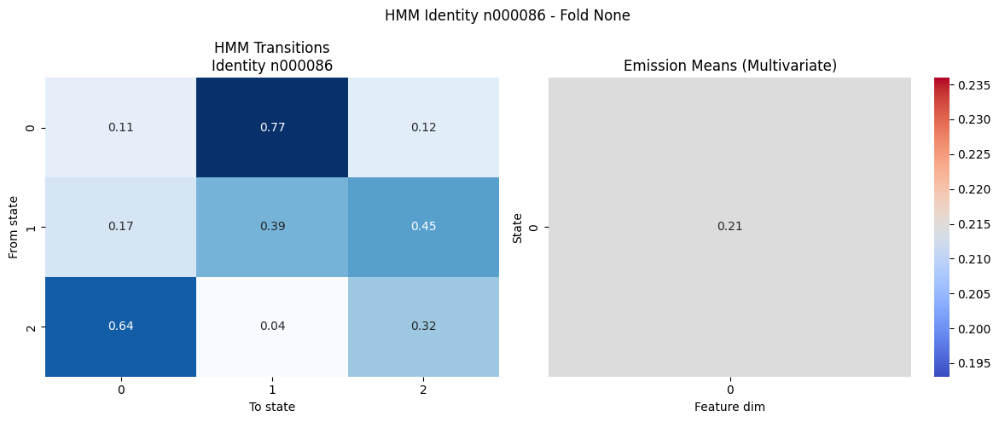

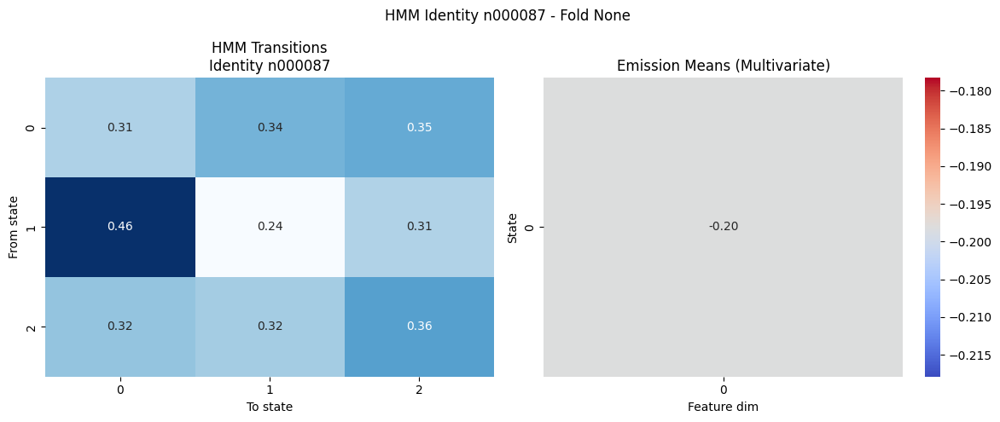

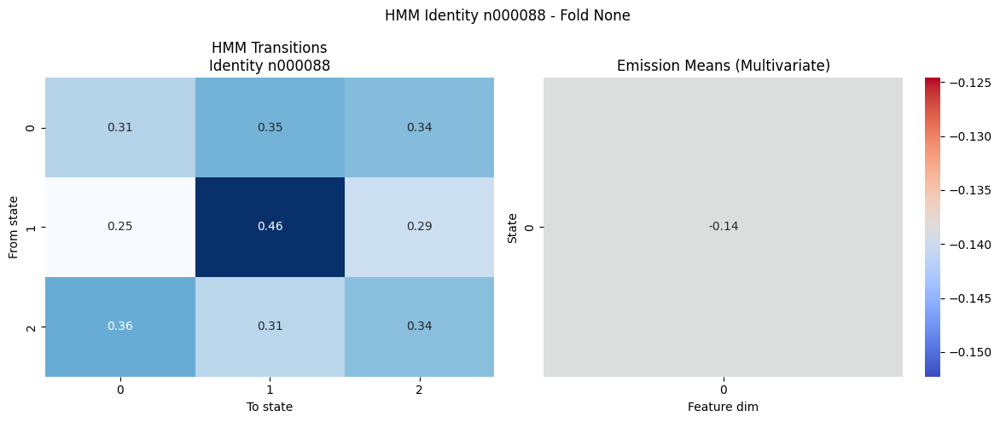

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


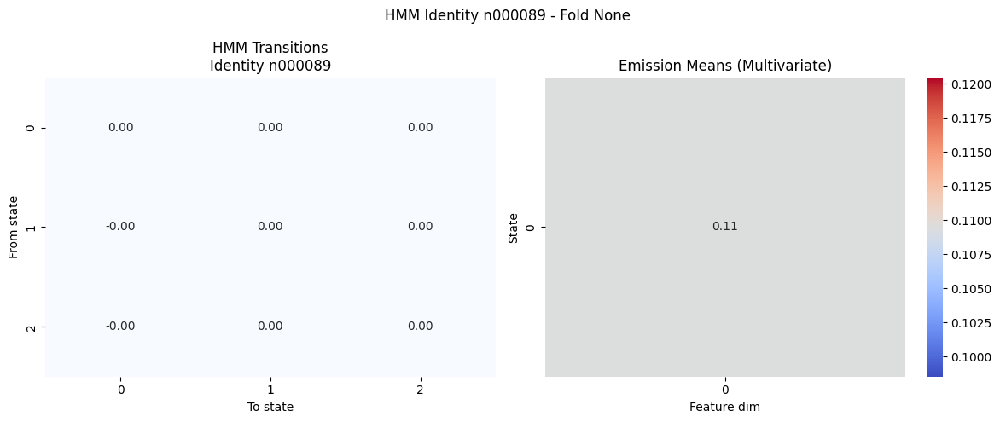

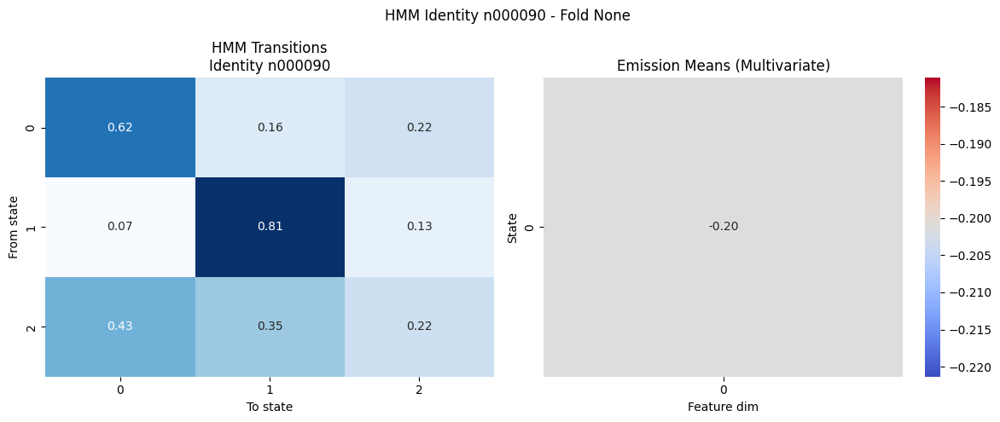

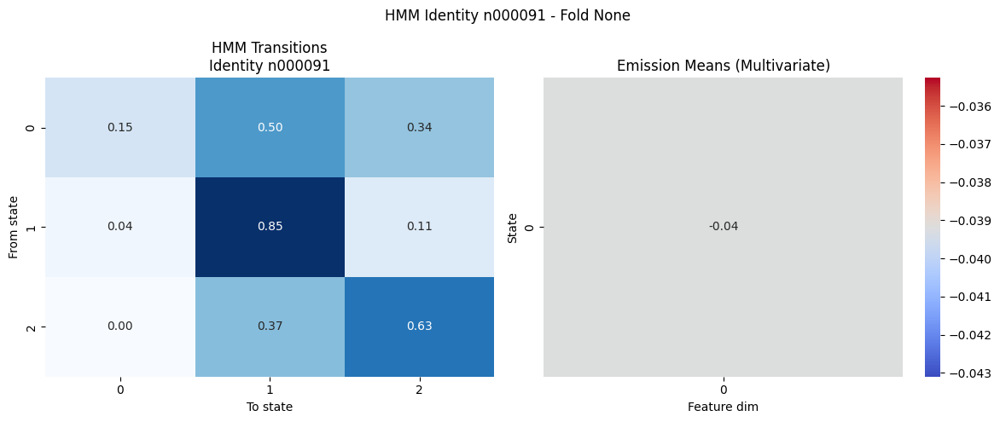

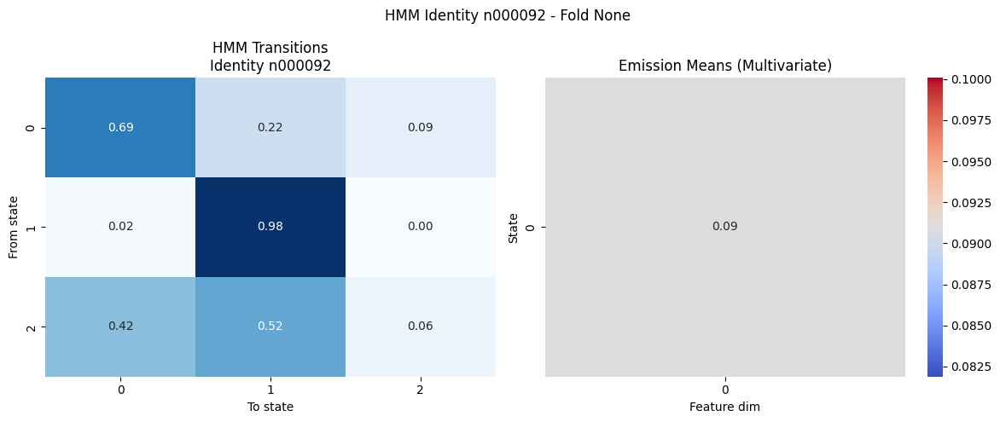

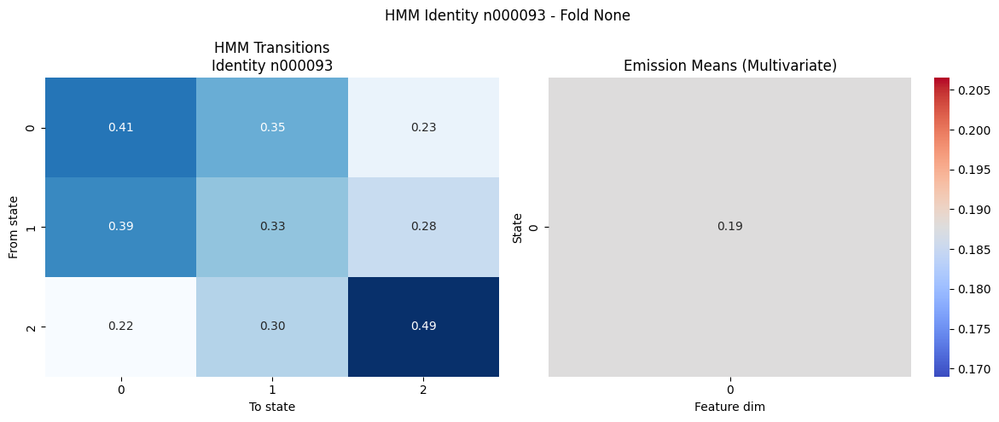

...

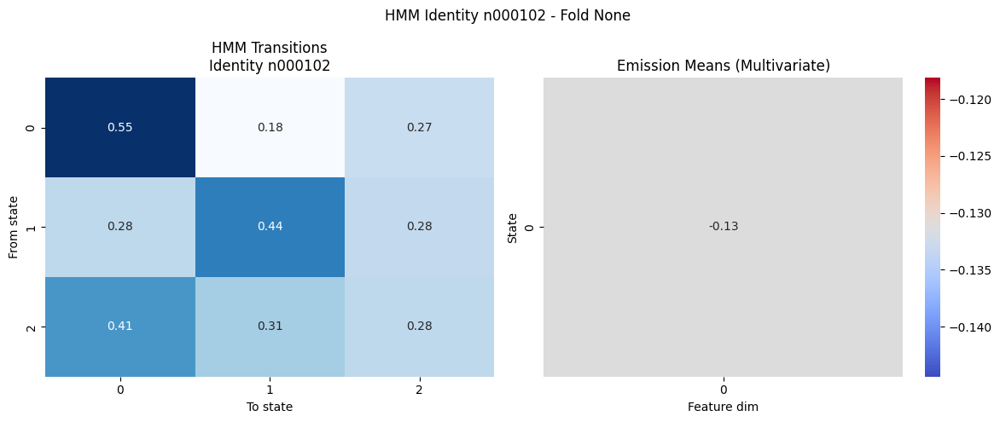

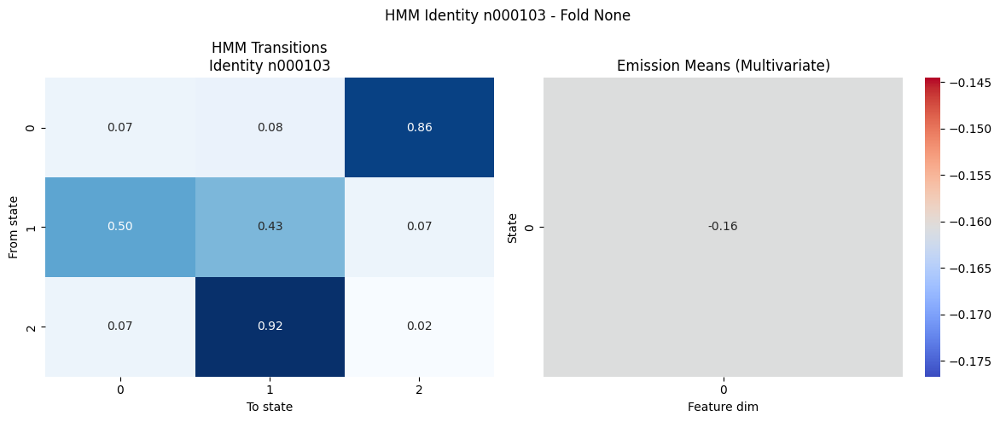

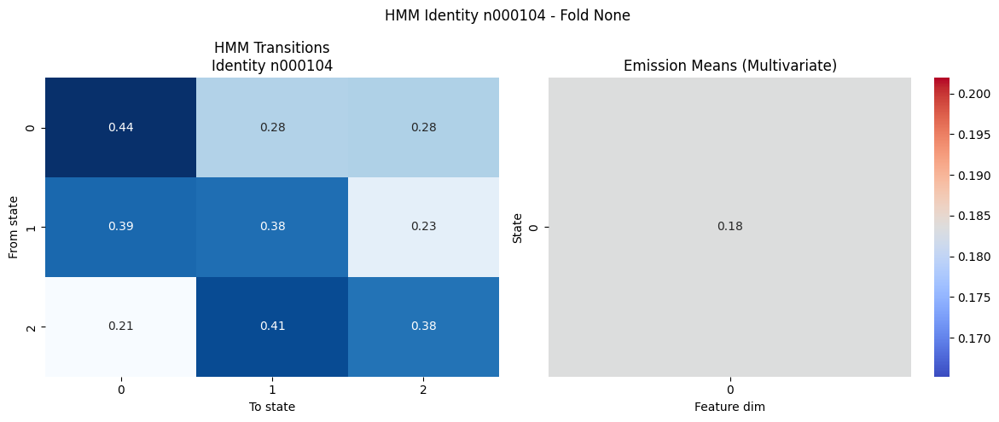

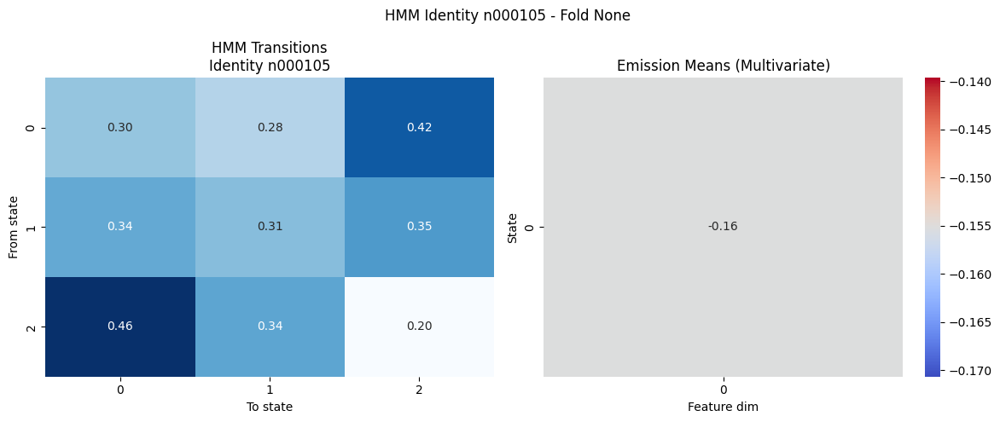

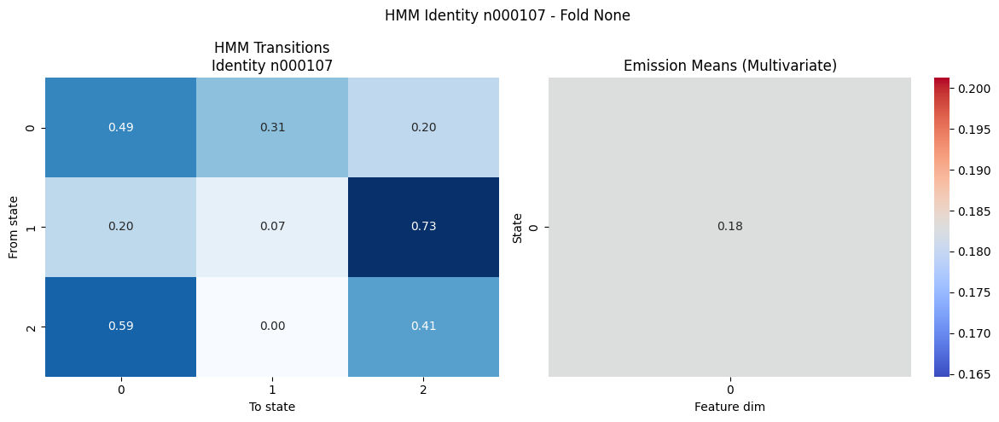

In [ ]:
plot_hmm_structure(best_hmm["models"], n_states=3)
plot_hmm_models(best_hmm["models"])

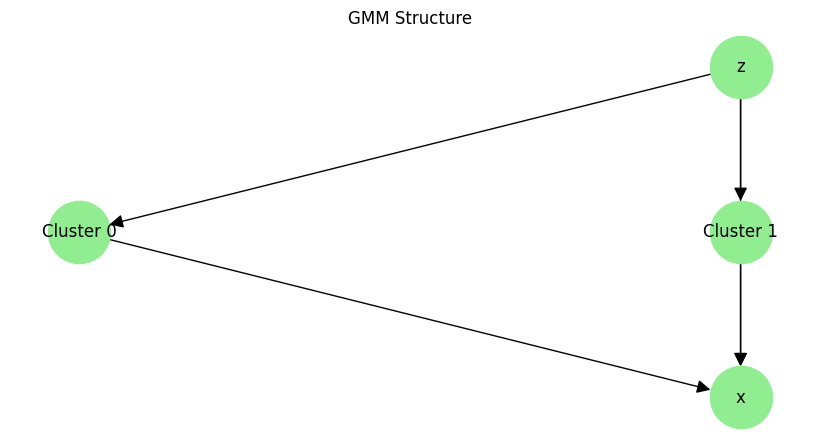

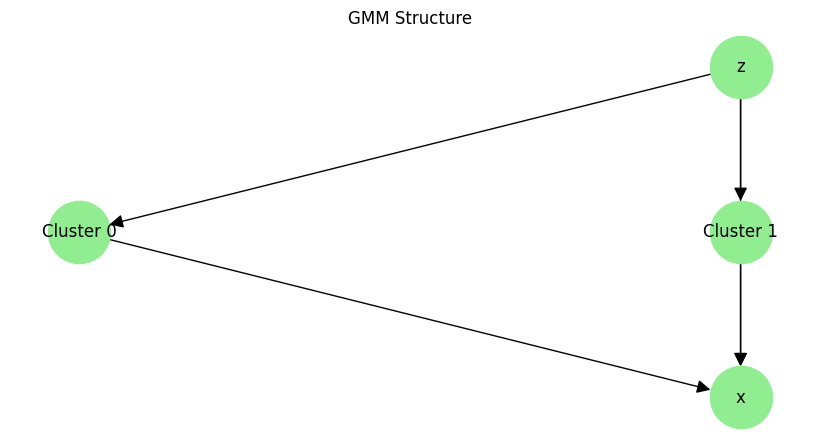

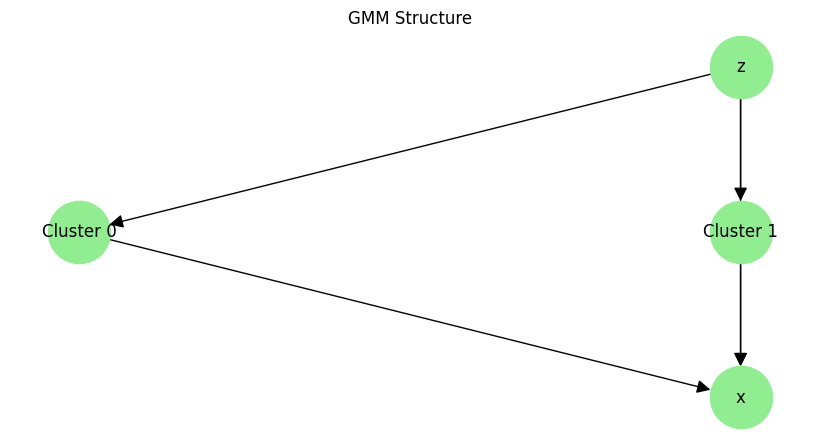

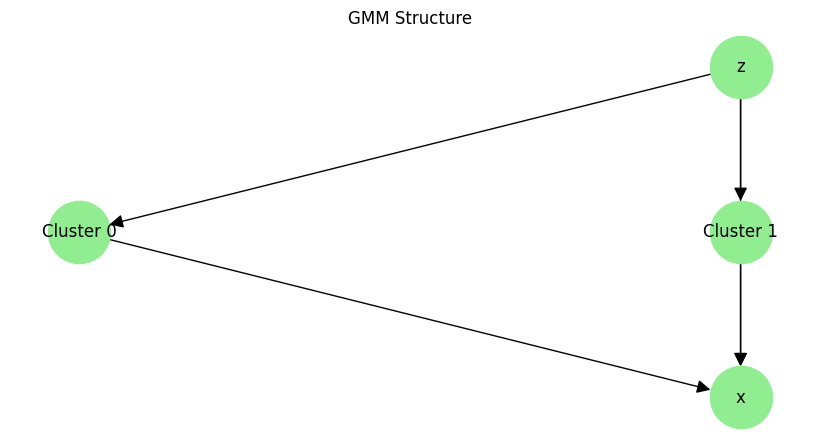

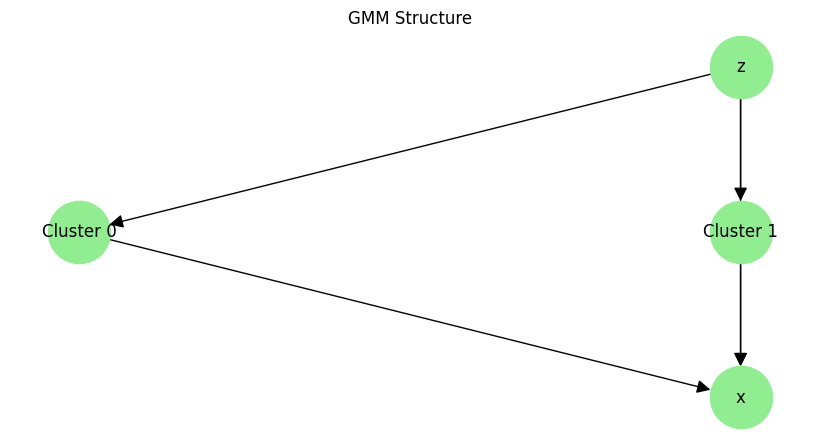

...

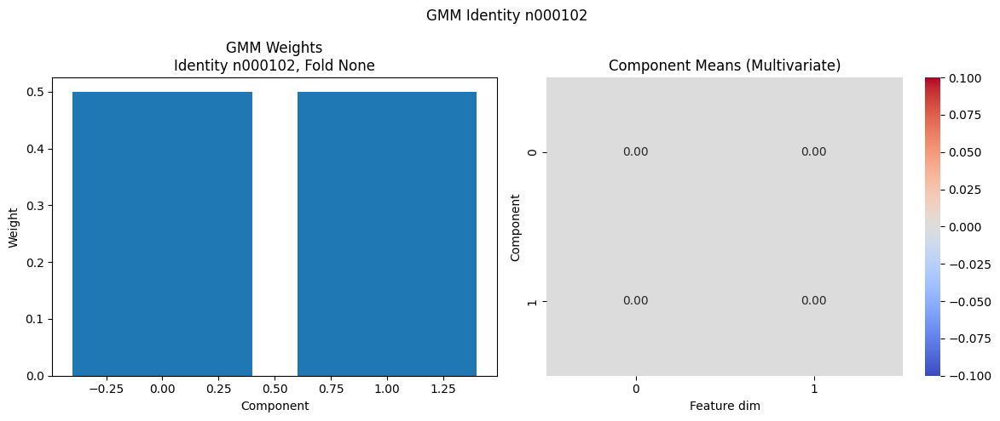

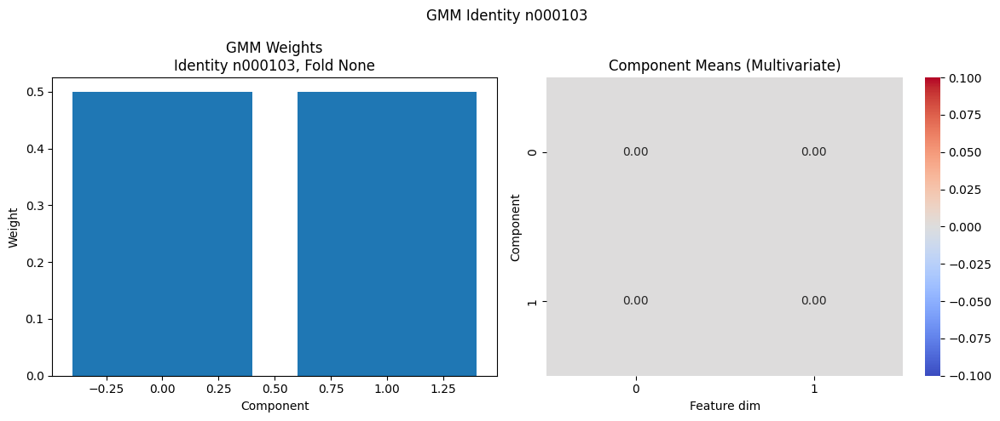

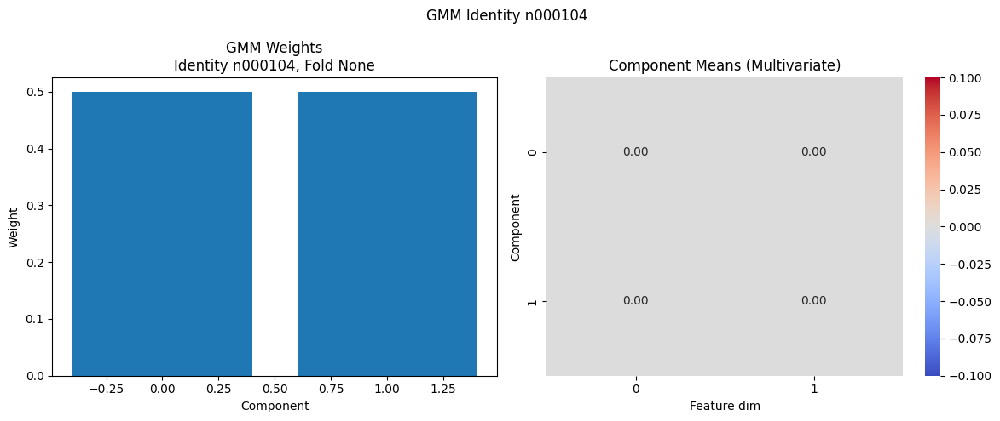

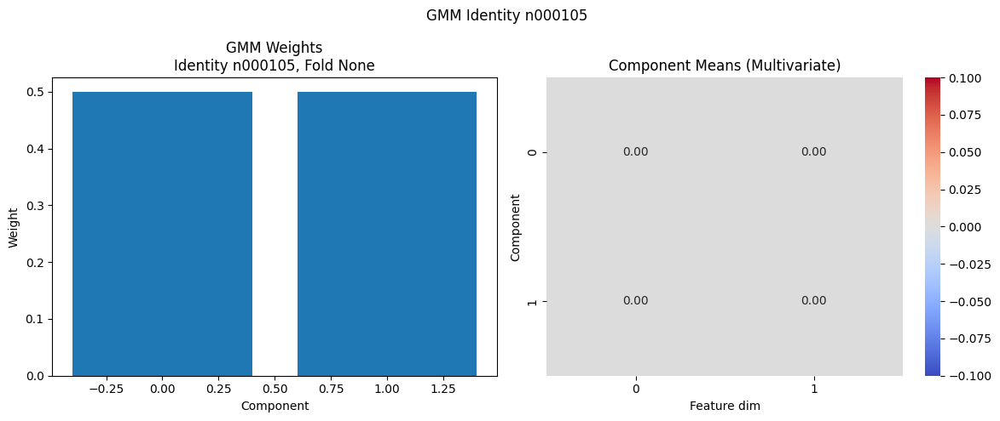

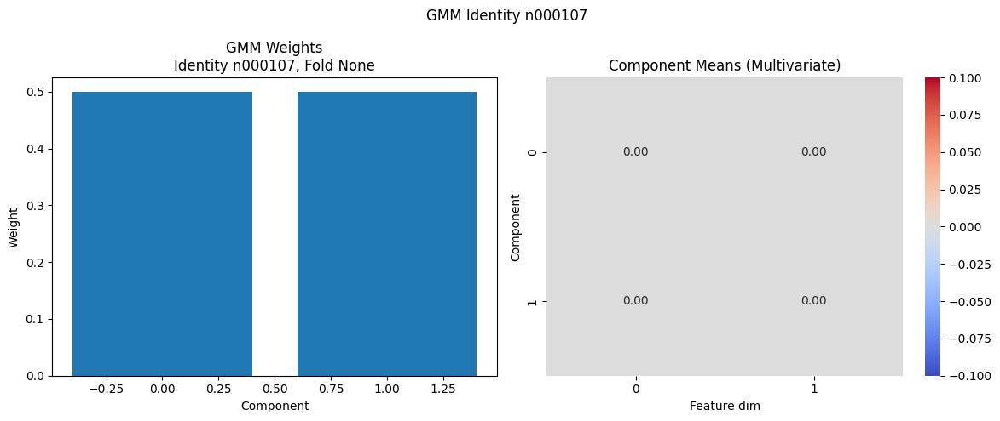

In [ ]:
plot_gmm_structure(best_gmm["models"])
plot_gmm_models(best_gmm["models"])

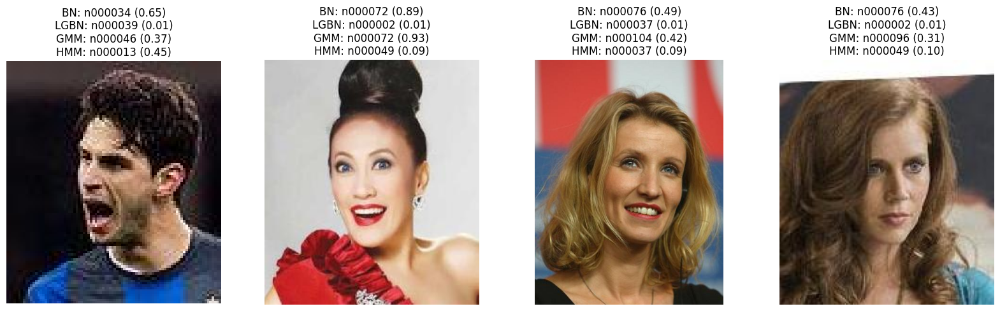

In [ ]:
demo_face_identification(path + "/train", n_samples=4,
                         bn_model=best_bn,
                         lgbn_model=best_lgbn,
                         hmm_model=best_hmm,
                         gmm_model=best_gmm)